In [4]:
import pandas as pd
import os

# Define file paths
base_path = os.path.expanduser('~/downloads/')
file_names = {
    'Hyderabad': 'hyd-temp-rains.csv',
    'Ahmedabad': 'amd-temp-rains.csv',
    'Bengaluru': 'bengaluru-temp-rains.csv',
    'Chennai': 'chennai-temp-rains.csv',
    'Mumbai': 'mumbai-temp-rains.csv',
    'Delhi': 'delhi-temp-rains.csv'
}

# Load datasets into a dictionary
city_dataframes = {}
for city, file_name in file_names.items():
    file_path = os.path.join(base_path, file_name)
    city_dataframes[city] = pd.read_csv(file_path)




In [5]:
print(city_dataframes['Hyderabad'].head())

         Date Rain     Temp Max     Temp Min
0  01-01-1951    0  28.94000053  15.57999992
1  02-01-1951    0  27.88999939  13.85999966
2  03-01-1951    0  27.31999969  12.38000011
3  04-01-1951    0  27.67000008  13.06000042
4  05-01-1951    0  28.31999969  14.78999996


In [6]:
import pandas as pd
import numpy as np
# I found a lot of problems (data outof bound) in the formatting of date and time, so I kept iterating and came up with this method
for city, df in city_dataframes.items():
    # First, attempt normal datetime parsing (dayfirst=True for Indian dates)
    df['Date'] = pd.to_datetime(df['Date'], dayfirst=True, errors='coerce')

    
    invalid_dates_idx = df[df['Date'].isna()].index

    
    if len(invalid_dates_idx) > 0:
        # Try to safely convert these to numeric values
        numeric_dates = pd.to_numeric(df.loc[invalid_dates_idx, 'Date'], errors='coerce')

        # Set reasonable Excel numeric bounds (for example dates between year 1900 and 2100)
        # Excel date numbers roughly: 1 Jan 1900 is ~1, 1 Jan 2100 ~73050
        numeric_valid = numeric_dates.between(1, 73050)

        # Only safely convert valid Excel numeric dates
        safe_idx = numeric_valid[numeric_valid].index
        df.loc[safe_idx, 'Date'] = pd.to_datetime(
            numeric_dates.loc[safe_idx],
            origin='1899-12-30',
            unit='D',
            errors='coerce'
        )

    # After correcting, drop any remaining invalid dates
    df.dropna(subset=['Date'], inplace=True)

# Check data is fixed correctly (example Hyderabad)
print(city_dataframes['Hyderabad'].head())


        Date Rain     Temp Max     Temp Min
0 1951-01-01    0  28.94000053  15.57999992
1 1951-01-02    0  27.88999939  13.85999966
2 1951-01-03    0  27.31999969  12.38000011
3 1951-01-04    0  27.67000008  13.06000042
4 1951-01-05    0  28.31999969  14.78999996


In [7]:
import pandas as pd

# Identify missing data in each city's dataframe
for city, df in city_dataframes.items():
    print(f"Missing data summary for {city}:")
    print(df.isnull().sum())
    print("-" * 40)

# Handle missing data:
# Option 1: Fill missing temperature values using forward-fill method (recommended for temperature data)
# Option 2: Fill missing rainfall data with zeros (as no rain typically indicates 0 mm rainfall)

for city, df in city_dataframes.items():
    # Temperature columns
    df['Temp Max'].fillna(method='ffill', inplace=True)
    df['Temp Min'].fillna(method='ffill', inplace=True)

    # Rainfall columns
    df['Rain'].fillna(0, inplace=True)

    # Drop any remaining missing dates, if any (these might be negligible after previous steps)
    df.dropna(subset=['Date'], inplace=True)

# Confirm all missing values are handled
for city, df in city_dataframes.items():
    print(f"Post-processing missing data summary for {city}:")
    print(df.isnull().sum())
    print("-" * 40)


Missing data summary for Hyderabad:
Date        0
Rain        0
Temp Max    0
Temp Min    0
dtype: int64
----------------------------------------
Missing data summary for Ahmedabad:
Date              0
Rain              0
Temp Max          0
Temp Min          1
Location      25965
Rain.1         1238
Temp Max.1     1238
Temp Min.1     1239
Location.1    25966
dtype: int64
----------------------------------------
Missing data summary for Bengaluru:
Date        0
Rain        8
Temp Max    7
Temp Min    8
dtype: int64
----------------------------------------
Missing data summary for Chennai:
Date            0
Rain        25568
Temp Max        1
Temp Min        1
dtype: int64
----------------------------------------
Missing data summary for Mumbai:
Date            0
Rain        25568
Temp Max        0
Temp Min        1
dtype: int64
----------------------------------------
Missing data summary for Delhi:
Date        0
Rain        0
Temp Max    0
Temp Min    1
dtype: int64
------------------

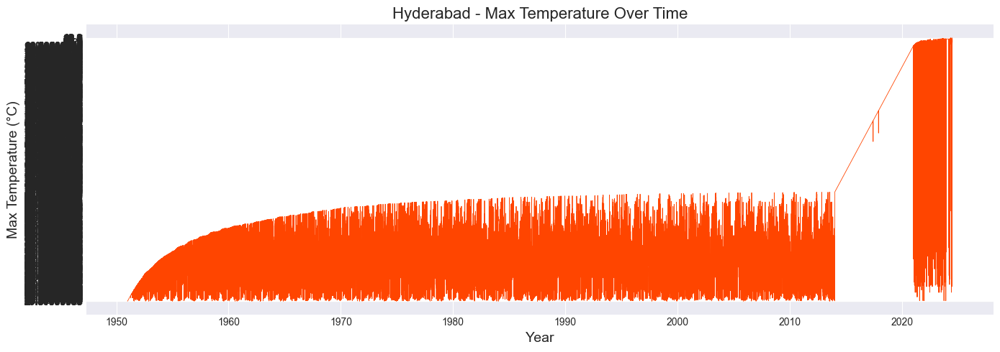

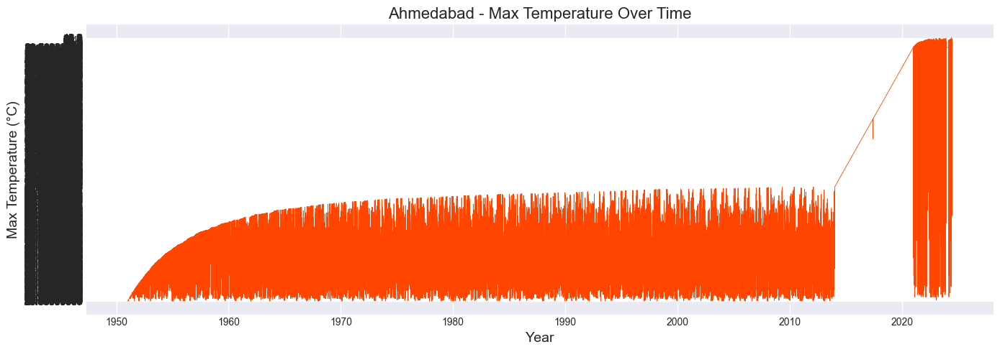

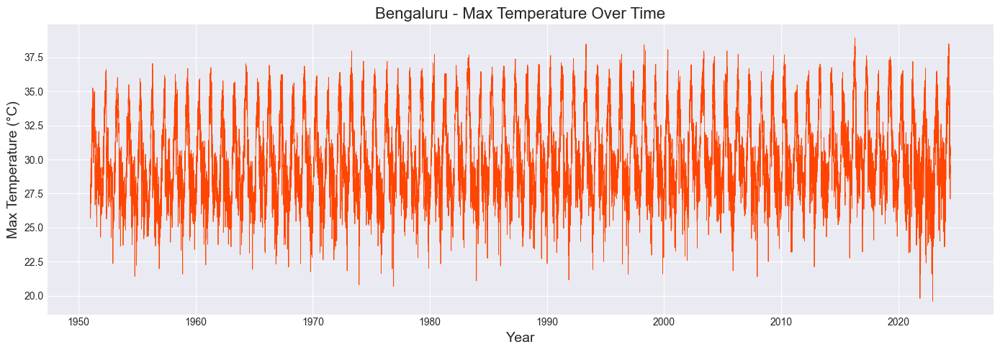

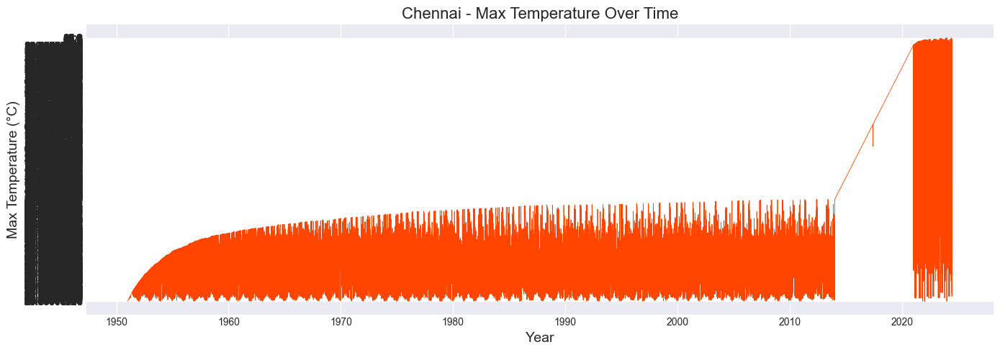

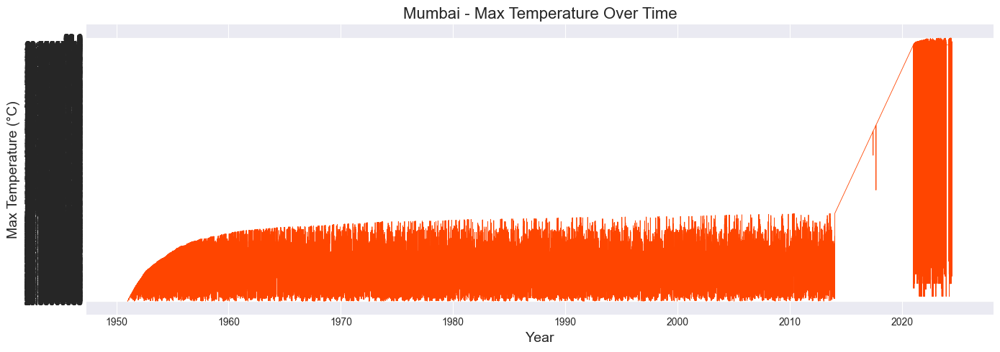

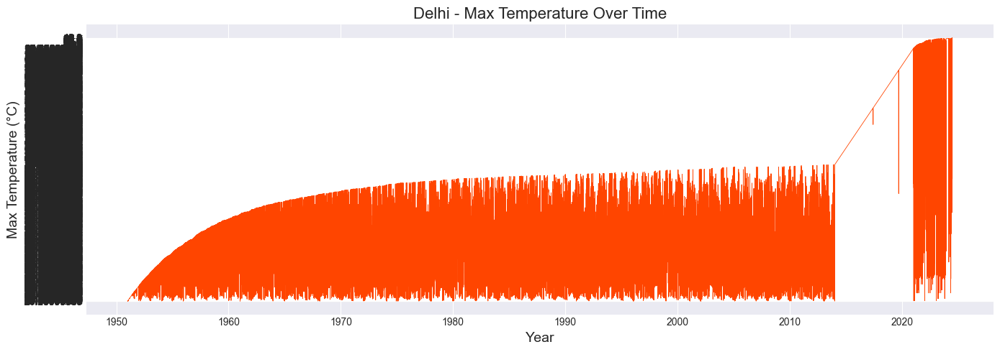

In [8]:
import matplotlib.pyplot as plt

# Set plot style
plt.style.use('seaborn-v0_8-darkgrid')

# Plot Max Temperature individually for each city
for city, df in city_dataframes.items():
    plt.figure(figsize=(14, 5))
    plt.plot(df['Date'], df['Temp Max'], color='orangered', linewidth=0.6)
    plt.title(f'{city} - Max Temperature Over Time', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Max Temperature (°C)', fontsize=14)
    plt.tight_layout()
    plt.show()


In [9]:
# Ensure Temp Max and Temp Min are numeric
for city, df in city_dataframes.items():
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce')
    df['Temp Min'] = pd.to_numeric(df['Temp Min'], errors='coerce')
    
    # Handle any NaN values after conversion by forward-fill method
    df['Temp Max'].fillna(method='ffill', inplace=True)
    df['Temp Min'].fillna(method='ffill', inplace=True)


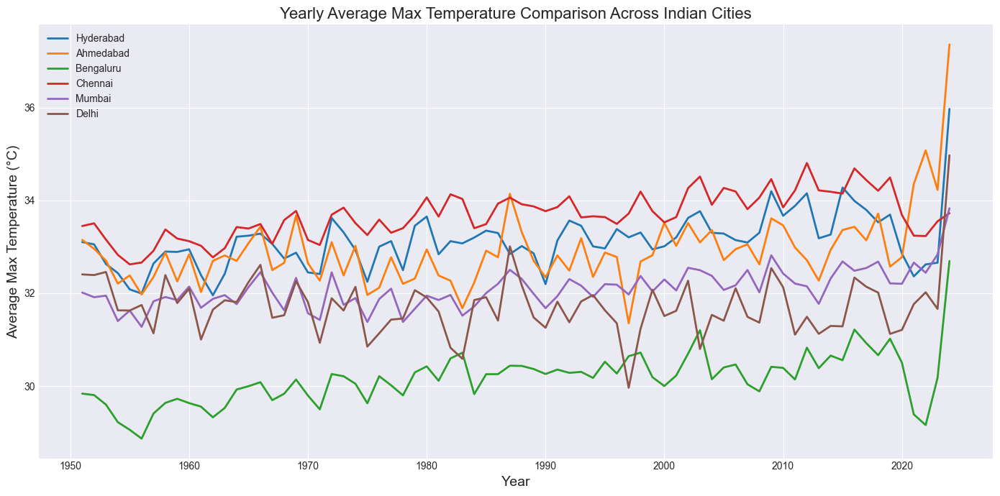

In [10]:
import matplotlib.pyplot as plt

plt.style.use('seaborn-v0_8-darkgrid')

plt.figure(figsize=(14, 7))

# Plot yearly average max temperature for each city
for city, df in city_dataframes.items():
    yearly_avg_temp = df.resample('Y', on='Date')['Temp Max'].mean()
    plt.plot(yearly_avg_temp.index.year, yearly_avg_temp, linewidth=2, label=city)

plt.title('Yearly Average Max Temperature Comparison Across Indian Cities', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Max Temperature (°C)', fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/3554262639.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


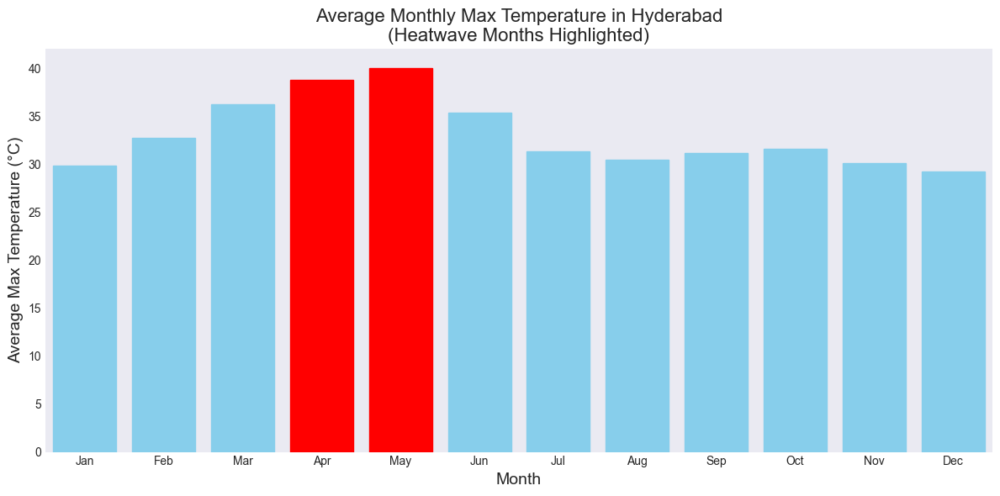

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/3554262639.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


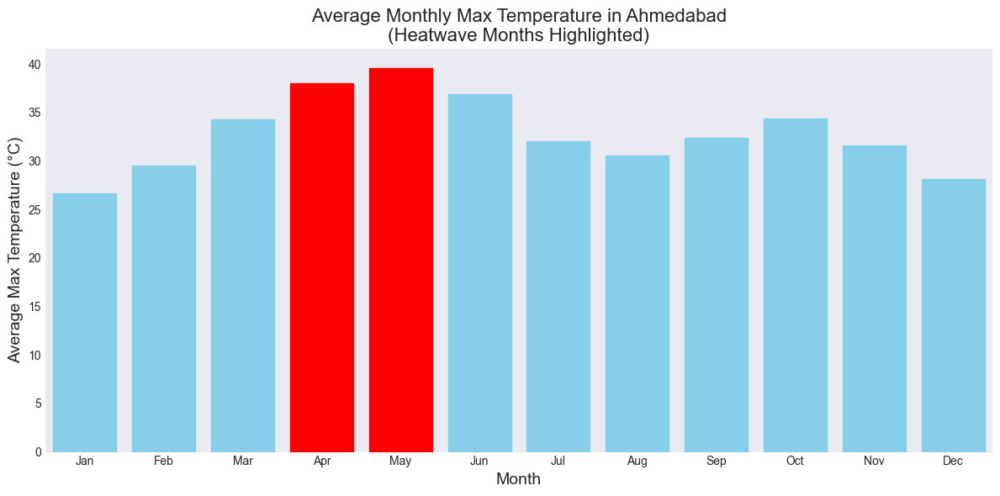

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/3554262639.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


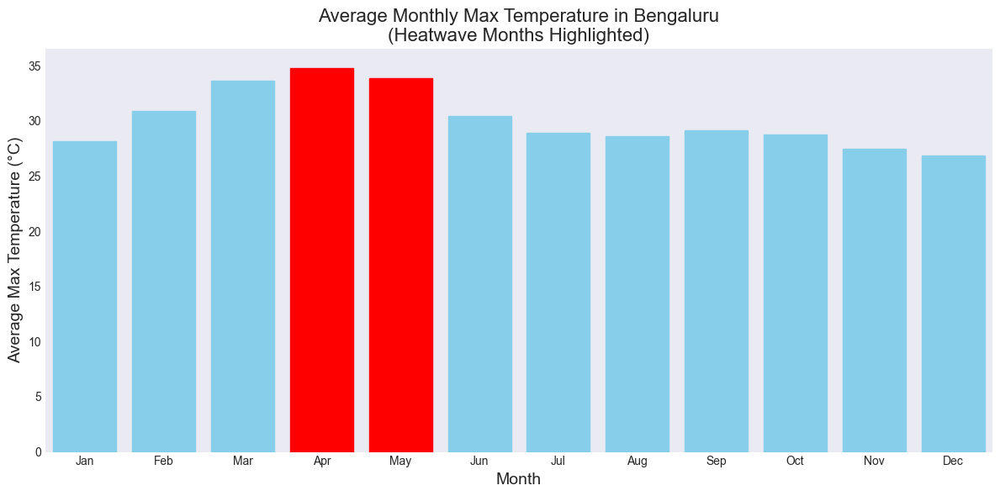

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/3554262639.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


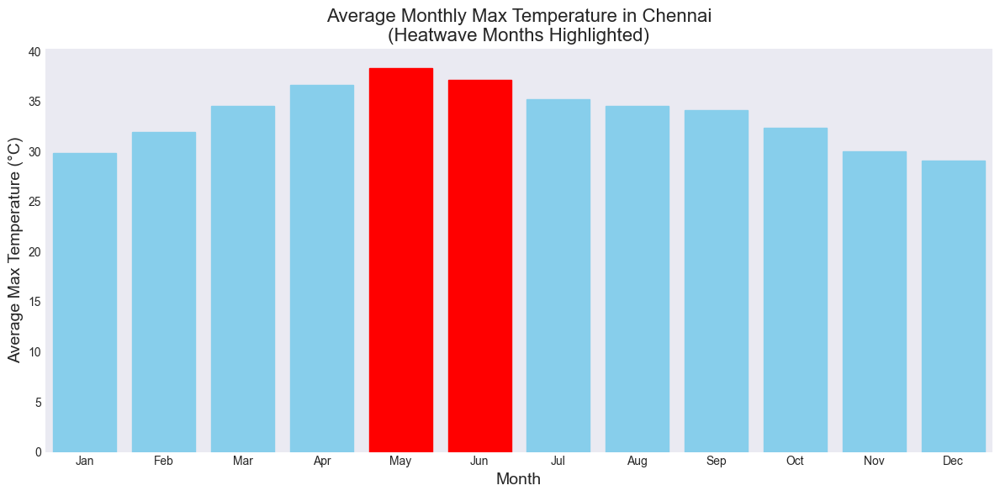

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/3554262639.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


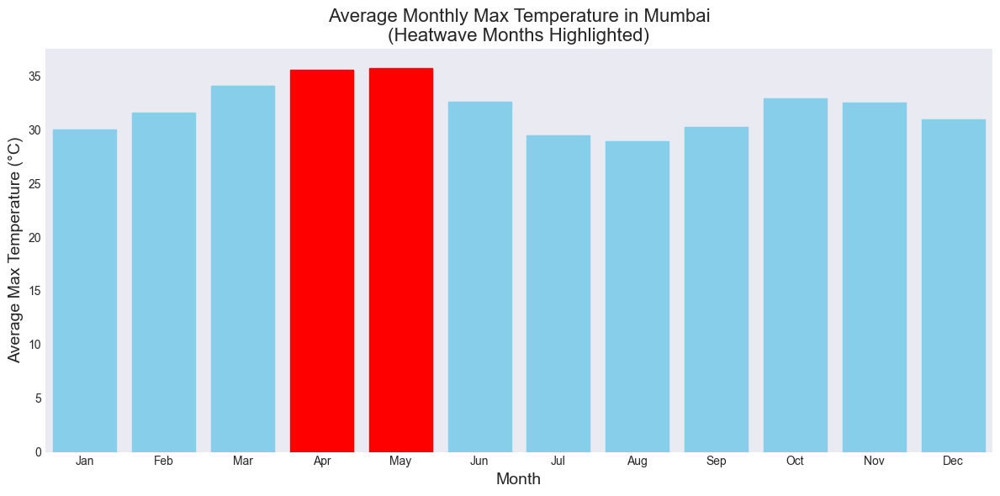

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/3554262639.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


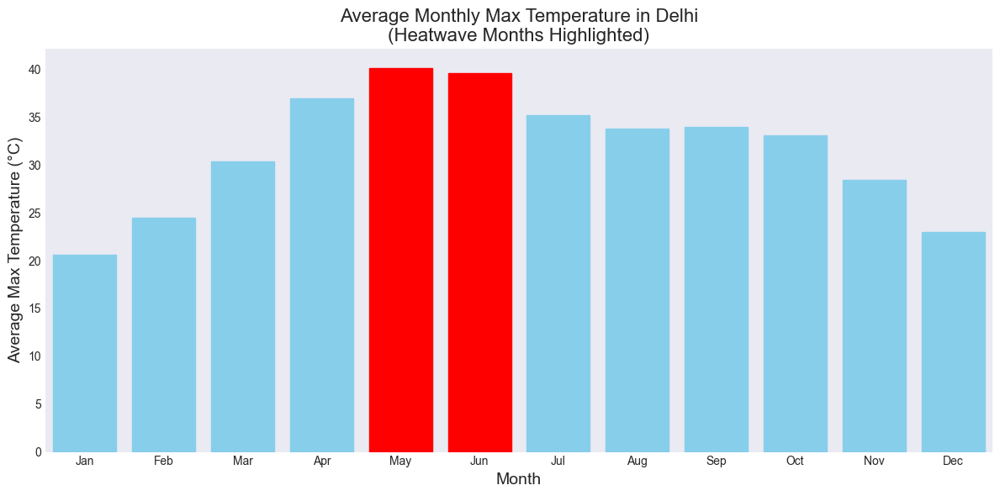

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn-v0_8-darkgrid')

for city, df in city_dataframes.items():
    # Ensure Temp Max is numeric
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce')
    
    # Extract month and compute average monthly max temperature across all years
    df['Month'] = df['Date'].dt.month
    monthly_avg_temp = df.groupby('Month')['Temp Max'].mean()

    # Identify heatwave months (top 2 hottest months)
    heatwave_months = monthly_avg_temp.nlargest(2).index.tolist()

    plt.figure(figsize=(12, 6))
    bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')

    # Highlight heatwave months
    for bar, month in zip(bars.patches, monthly_avg_temp.index):
        if month in heatwave_months:
            bar.set_color('red')
        else:
            bar.set_color('skyblue')

    plt.title(f'Average Monthly Max Temperature in {city}\n(Heatwave Months Highlighted)', fontsize=16)
    plt.xlabel('Month', fontsize=14)
    plt.ylabel('Average Max Temperature (°C)', fontsize=14)
    plt.xticks(range(0,12), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                             'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()


/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/2748812302.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=above_normal_yearly.index, y=above_normal_yearly.values, palette='RdYlBu_r')


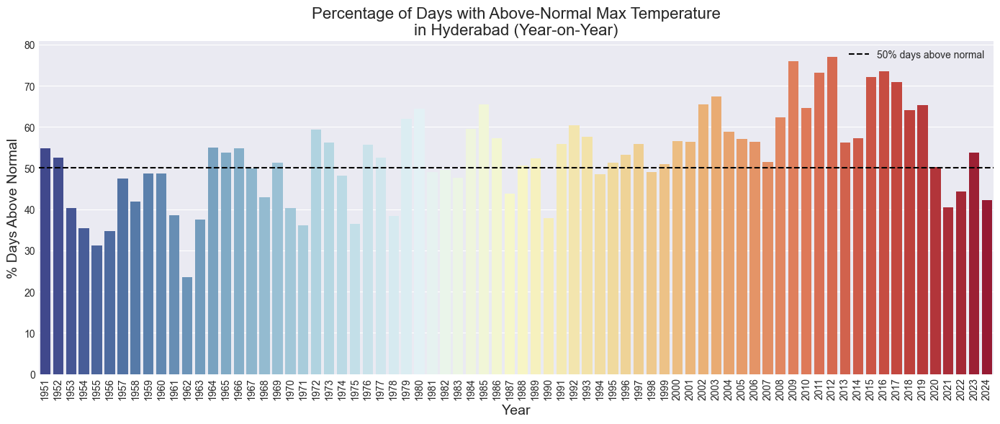

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/2748812302.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=above_normal_yearly.index, y=above_normal_yearly.values, palette='RdYlBu_r')


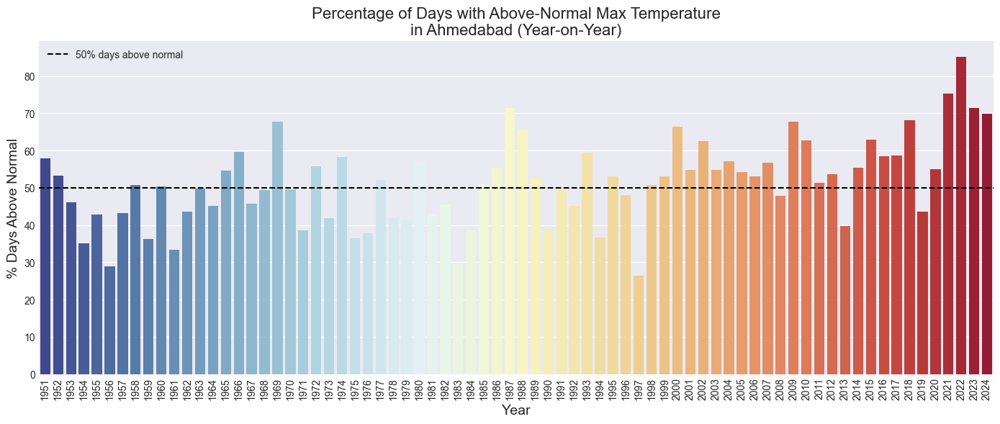

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/2748812302.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=above_normal_yearly.index, y=above_normal_yearly.values, palette='RdYlBu_r')


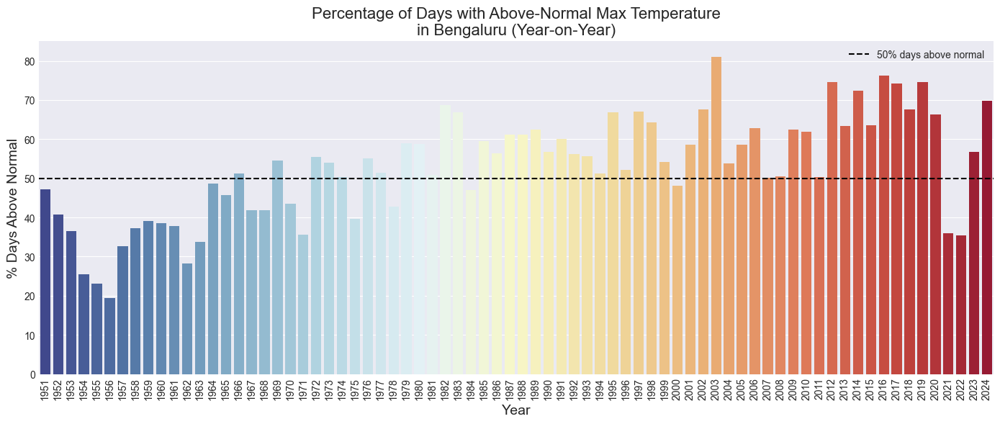

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/2748812302.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=above_normal_yearly.index, y=above_normal_yearly.values, palette='RdYlBu_r')


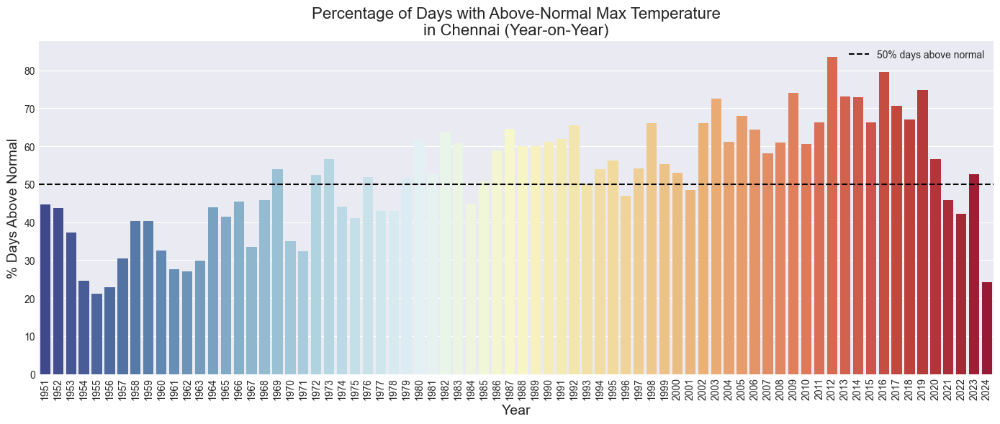

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/2748812302.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=above_normal_yearly.index, y=above_normal_yearly.values, palette='RdYlBu_r')


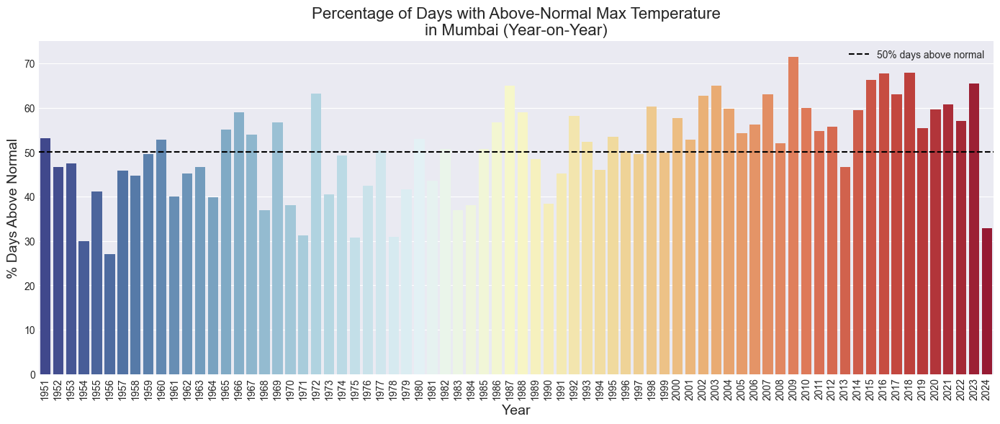

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/2748812302.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=above_normal_yearly.index, y=above_normal_yearly.values, palette='RdYlBu_r')


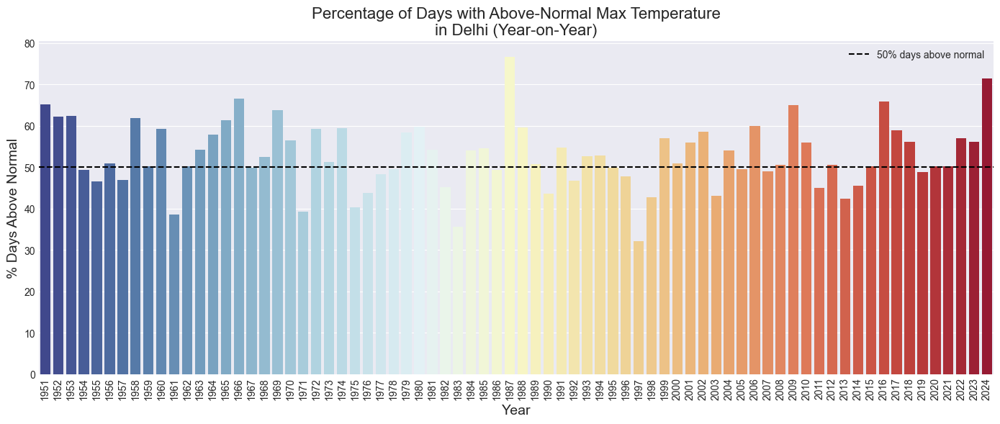

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn-v0_8-darkgrid')

for city, df in city_dataframes.items():
    # Ensure temperatures are numeric
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce')
    
    # Extract year and month from date
    df['Year'] = df['Date'].dt.year
    df['Month'] = df['Date'].dt.month
    
    # Compute historical average (Normal temperature) per month
    normal_monthly_temp = df.groupby('Month')['Temp Max'].mean()
    
    # Add a column to indicate whether the temp is above normal
    df['Above_Normal'] = df.apply(lambda x: x['Temp Max'] > normal_monthly_temp.loc[x['Month']], axis=1)
    
    # Calculate percentage of days above normal each year
    above_normal_yearly = df.groupby('Year')['Above_Normal'].mean() * 100

    # Plotting the results
    plt.figure(figsize=(14, 6))
    sns.barplot(x=above_normal_yearly.index, y=above_normal_yearly.values, palette='RdYlBu_r')

    # Add reference line for 50%
    plt.axhline(50, color='black', linestyle='--', label='50% days above normal')

    plt.title(f'Percentage of Days with Above-Normal Max Temperature\nin {city} (Year-on-Year)', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('% Days Above Normal', fontsize=14)
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [13]:
import pandas as pd
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

plt.style.use('seaborn-v0_8-darkgrid')

forecast_horizon = 2035

In [14]:
for city, df in city_dataframes.items():
    # Prepare yearly average max temperature data
    df['Year'] = df['Date'].dt.year
    yearly_temp = df.groupby('Year')['Temp Max'].mean().dropna()

    # Train-test split (80% train, 20% test)
    split_point = int(len(yearly_temp) * 0.8)
    train, test = yearly_temp[:split_point], yearly_temp[split_point:]

    # Train ARIMA model
    model = auto_arima(train, seasonal=False, stepwise=True, trace=False)

    # Forecast on test set
    forecast_test = model.predict(n_periods=int(len(test)))

    # Evaluate forecast accuracy
    mae = mean_absolute_error(test, forecast_test)
    rmse = np.sqrt(mean_squared_error(test, forecast_test))

    # Refit the model on the full dataset
    model.fit(yearly_temp)

    # Calculate number of future periods explicitly as integer
    future_periods = int(forecast_horizon - yearly_temp.index.max())

/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a su

/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a su

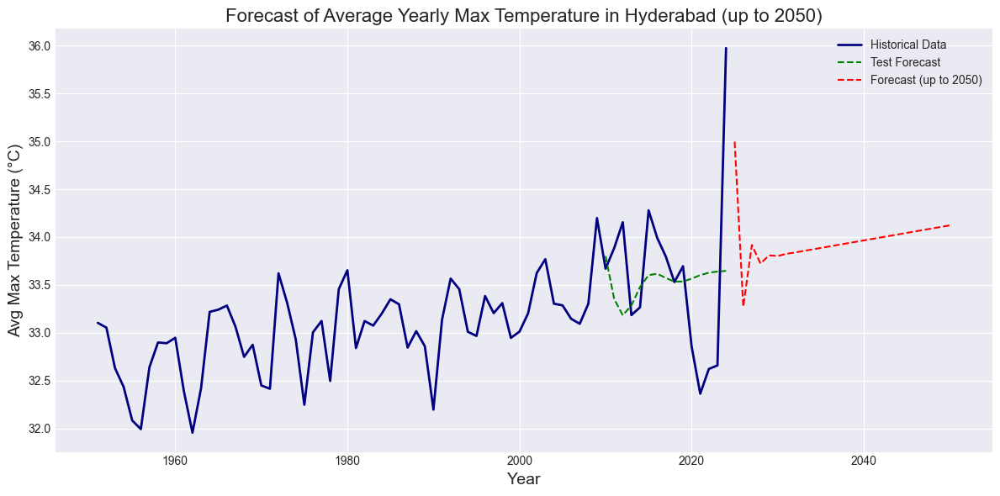

Forecasting Metrics for Hyderabad:
 - ARIMA Model Order: (2, 1, 2)
 - Mean Absolute Error (MAE): 0.64
 - Root Mean Squared Error (RMSE): 0.87
------------------------------------------------------------


/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a su

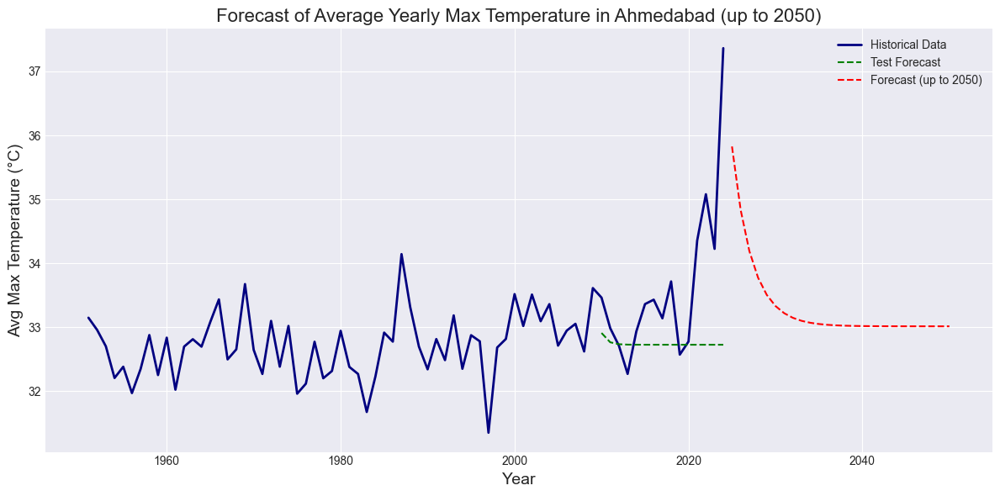

Forecasting Metrics for Ahmedabad:
 - ARIMA Model Order: (1, 0, 0)
 - Mean Absolute Error (MAE): 0.97
 - Root Mean Squared Error (RMSE): 1.52
------------------------------------------------------------


/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a su

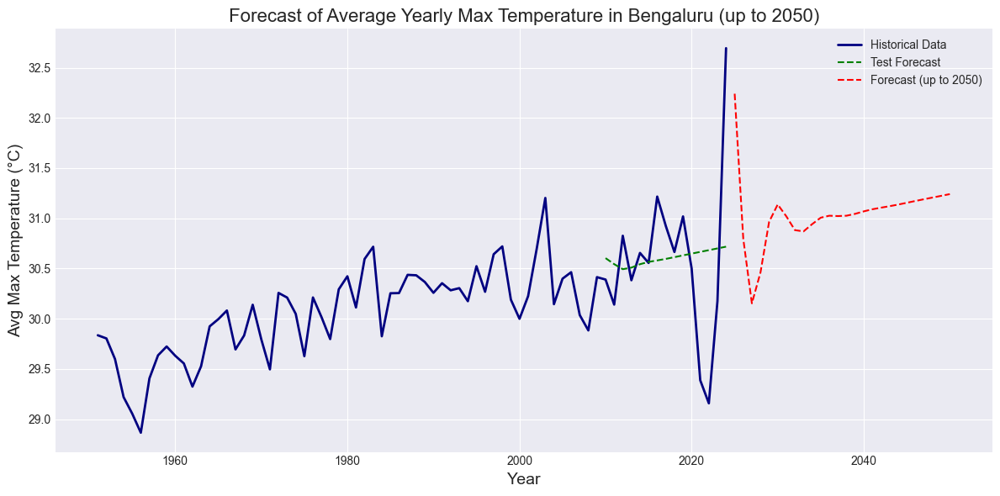

Forecasting Metrics for Bengaluru:
 - ARIMA Model Order: (2, 1, 1)
 - Mean Absolute Error (MAE): 0.54
 - Root Mean Squared Error (RMSE): 0.78
------------------------------------------------------------


/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a su

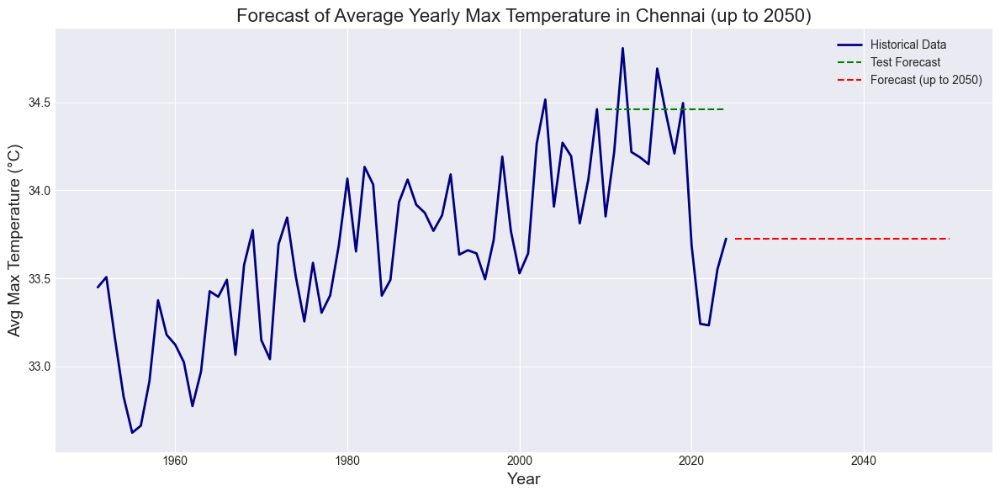

Forecasting Metrics for Chennai:
 - ARIMA Model Order: (0, 1, 0)
 - Mean Absolute Error (MAE): 0.50
 - Root Mean Squared Error (RMSE): 0.63
------------------------------------------------------------


/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a su

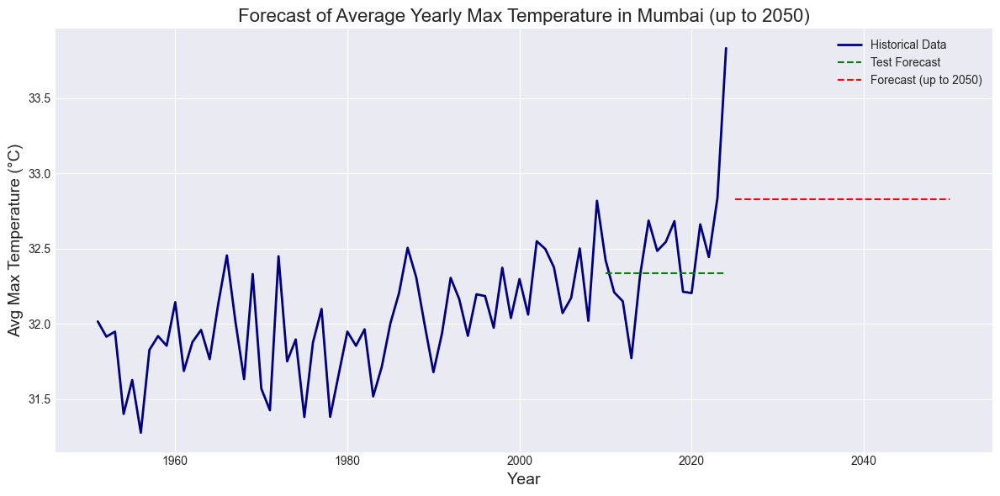

Forecasting Metrics for Mumbai:
 - ARIMA Model Order: (0, 1, 1)
 - Mean Absolute Error (MAE): 0.31
 - Root Mean Squared Error (RMSE): 0.47
------------------------------------------------------------


/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a su

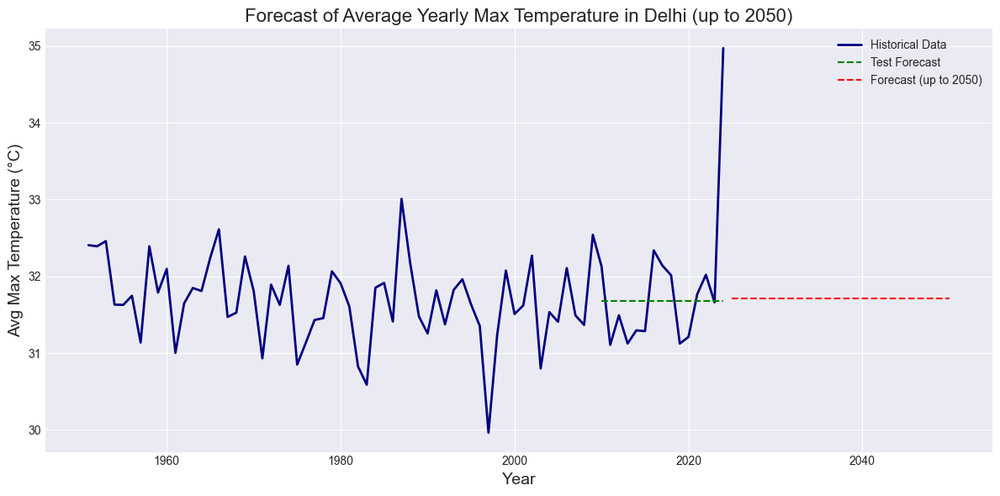

Forecasting Metrics for Delhi:
 - ARIMA Model Order: (0, 0, 0)
 - Mean Absolute Error (MAE): 0.58
 - Root Mean Squared Error (RMSE): 0.95
------------------------------------------------------------


In [15]:
import pandas as pd
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

plt.style.use('seaborn-v0_8-darkgrid')

forecast_horizon = 2050

for city, df in city_dataframes.items():
    # Ensure 'Temp Max' is numeric and handle missing values
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()

    # Compute yearly average max temperatures
    df['Year'] = df['Date'].dt.year
    yearly_temp = df.groupby('Year')['Temp Max'].mean().dropna()

    # Train-test split (80% train, 20% test)
    split_idx = int(len(yearly_temp) * 0.8)
    train, test = yearly_temp[:split_idx], yearly_temp[split_idx:]

    # Train ARIMA model with auto parameter selection
    model = auto_arima(train, seasonal=False, stepwise=True, trace=False)

    # Forecast for test set and evaluate accuracy
    test_forecast = model.predict(n_periods=int(len(test)))
    mae = mean_absolute_error(test, test_forecast)
    rmse = np.sqrt(mean_squared_error(test, test_forecast))

    # Retrain the model on the entire historical dataset
    model.fit(yearly_temp)

    # Calculate future periods explicitly as integer
    future_periods = int(forecast_horizon - yearly_temp.index.max())

    if future_periods <= 0:
        print(f"Forecast horizon ({forecast_horizon}) must be beyond the latest year ({yearly_temp.index.max()}) for city {city}.")
        continue

    # Forecast future temperatures until 2050
    future_forecast = model.predict(n_periods=future_periods)

    # Define forecast years
    forecast_years = np.arange(yearly_temp.index.max() + 1, forecast_horizon + 1)

    # Visualization
    plt.figure(figsize=(12, 6))
    plt.plot(yearly_temp.index, yearly_temp.values, label='Historical Data', linewidth=2, color='navy')
    plt.plot(test.index, test_forecast, label='Test Forecast', linestyle='--', color='green')
    plt.plot(forecast_years, future_forecast, label='Forecast (up to 2050)', linestyle='--', color='red')

    plt.title(f'Forecast of Average Yearly Max Temperature in {city} (up to 2050)', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Avg Max Temperature (°C)', fontsize=14)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Print model accuracy metrics
    print(f"Forecasting Metrics for {city}:")
    print(f" - ARIMA Model Order: {model.order}")
    print(f" - Mean Absolute Error (MAE): {mae:.2f}")
    print(f" - Root Mean Squared Error (RMSE): {rmse:.2f}")
    print("-" * 60)


# Trying Sarima

Processing SARIMA for Hyderabad...


/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


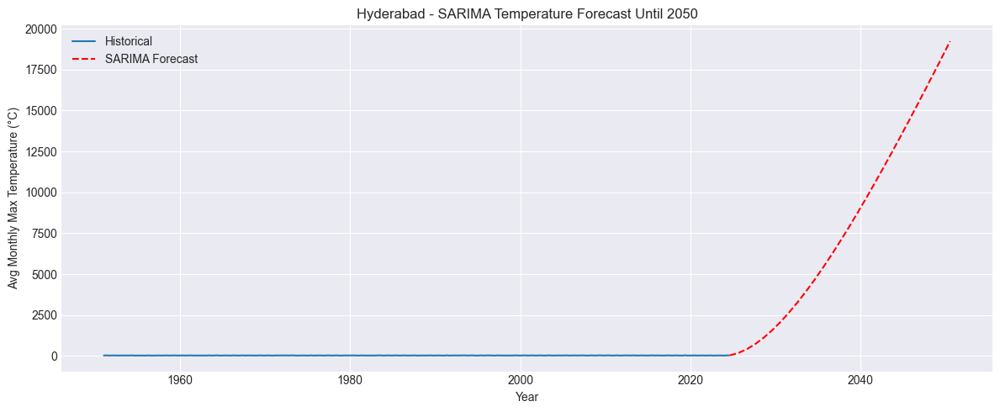

SARIMA Model Metrics for Hyderabad: MAE=1.20, RMSE=1.51
Processing SARIMA for Ahmedabad...


/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


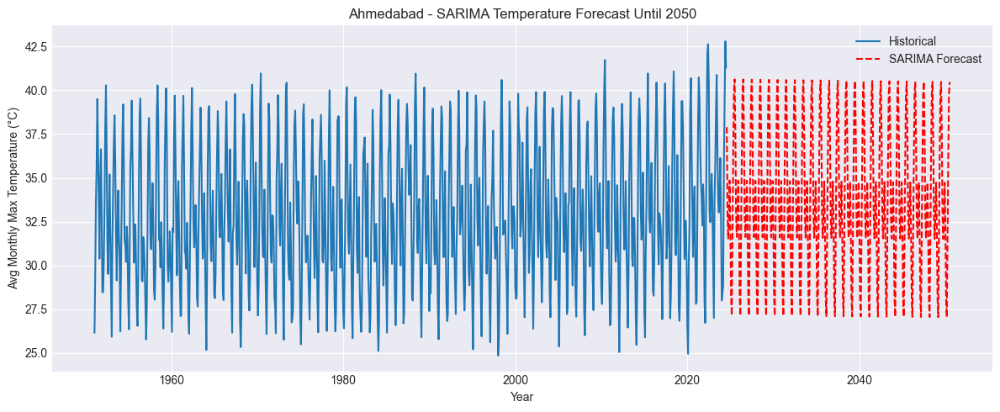

SARIMA Model Metrics for Ahmedabad: MAE=1.13, RMSE=1.49
Processing SARIMA for Bengaluru...


/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(3,1,1)(1,0,2)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/statespace/mlemodel.py", l

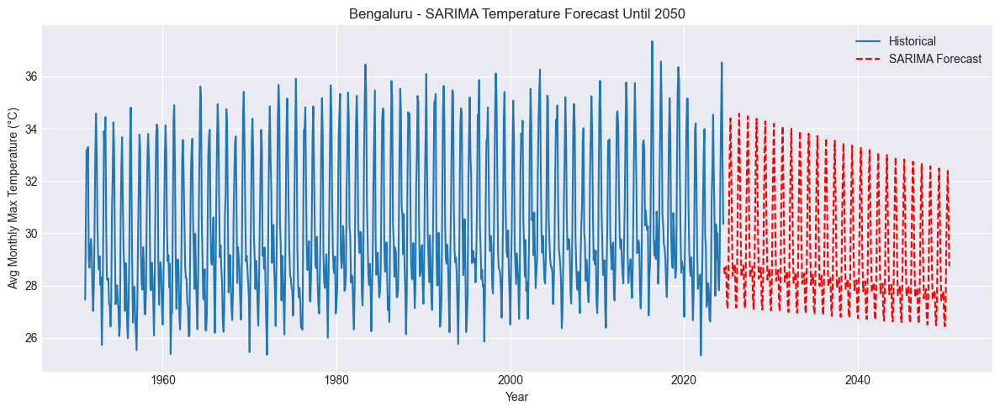

SARIMA Model Metrics for Bengaluru: MAE=0.73, RMSE=0.97
Processing SARIMA for Chennai...


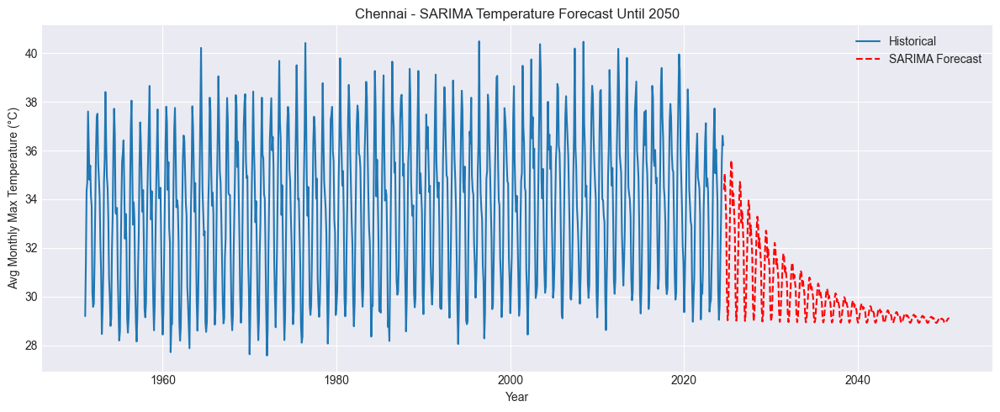

SARIMA Model Metrics for Chennai: MAE=2.68, RMSE=3.31
Processing SARIMA for Mumbai...


/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(0,0,2)(2,0,2)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/statespace/mlemodel.py", l

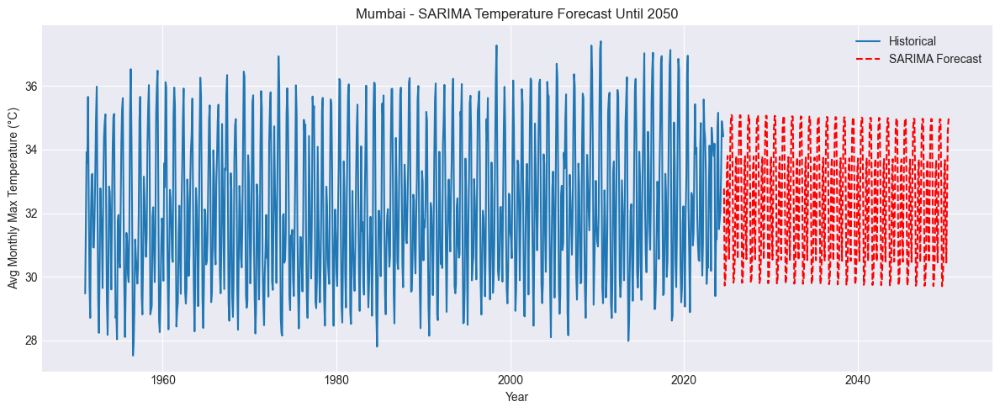

SARIMA Model Metrics for Mumbai: MAE=0.78, RMSE=0.97
Processing SARIMA for Delhi...


/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/madhusudhan/miniforge3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


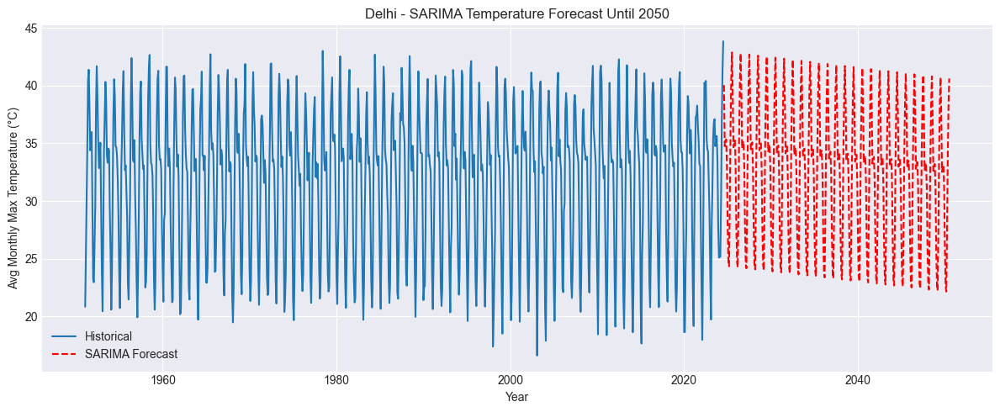

SARIMA Model Metrics for Delhi: MAE=1.20, RMSE=1.63
SARIMA Forecasting completed for all cities.


In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error

plt.style.use('seaborn-v0_8-darkgrid')

forecast_year = 2050

for city, df in city_dataframes.items():
    print(f"Processing SARIMA for {city}...")

    # Ensure numeric data and handle NaNs
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()
    df['Rain'] = pd.to_numeric(df['Rain'], errors='coerce').fillna(0)

    # Monthly aggregation
    monthly_df = df.set_index('Date').resample('M').agg({'Temp Max':'mean', 'Rain':'sum'}).dropna()

    # Train-test split
    split_idx = int(len(monthly_df) * 0.8)
    train, test = monthly_df.iloc[:split_idx], monthly_df.iloc[split_idx:]

    # SARIMA Model Training
    try:
        model = auto_arima(train['Temp Max'], seasonal=True, m=12, trace=False)
        test_forecast = model.predict(n_periods=int(len(test)))

        # Evaluate accuracy
        mae = mean_absolute_error(test['Temp Max'], test_forecast)
        rmse = np.sqrt(mean_squared_error(test['Temp Max'], test_forecast))

        # Refit model on full dataset
        model.fit(monthly_df['Temp Max'])

        # Calculate future periods explicitly as integer
        periods_until_2050 = int((forecast_year - monthly_df.index.year.max()) * 12)

        if periods_until_2050 <= 0:
            print(f"Forecast horizon ({forecast_year}) must be beyond the latest year for city {city}.")
            continue

        future_forecast = model.predict(n_periods=periods_until_2050)

        future_index = pd.date_range(
            start=monthly_df.index.max() + pd.DateOffset(months=1), 
            periods=periods_until_2050, 
            freq='M'
        )

        # Plot forecast
        plt.figure(figsize=(12, 5))
        plt.plot(monthly_df.index, monthly_df['Temp Max'], label='Historical')
        plt.plot(future_index, future_forecast, label='SARIMA Forecast', linestyle='--', color='red')
        plt.title(f'{city} - SARIMA Temperature Forecast Until 2050')
        plt.xlabel('Year')
        plt.ylabel('Avg Monthly Max Temperature (°C)')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        print(f"SARIMA Model Metrics for {city}: MAE={mae:.2f}, RMSE={rmse:.2f}")

    except Exception as e:
        print(f"❌ SARIMA failed for {city}: {e}")

print("SARIMA Forecasting completed for all cities.")


In [17]:
import pandas as pd
import numpy as np

heatwave_data = {}

for city, df in city_dataframes.items():
    # Ensure numeric data
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()

    # Calculate 90th percentile as threshold
    threshold = df['Temp Max'].quantile(0.90)

    # Identify days above threshold
    df['Above_Threshold'] = df['Temp Max'] > threshold

    # Identify heatwave events (3 or more consecutive days above threshold)
    df['Heatwave'] = (df['Above_Threshold'].rolling(window=3).sum() == 3)

    heatwave_days = df[df['Heatwave']]

    heatwave_data[city] = {
        'Threshold': threshold,
        'Total Heatwave Days': len(heatwave_days),
        'Heatwave Events': heatwave_days[['Date', 'Temp Max']]
    }

    print(f"\n🔥 {city}:")
    print(f" - Heatwave Threshold: {threshold:.2f}°C")
    print(f" - Historical Heatwave Days: {len(heatwave_days)}")



🔥 Hyderabad:
 - Heatwave Threshold: 39.49°C
 - Historical Heatwave Days: 1958

🔥 Ahmedabad:
 - Heatwave Threshold: 39.11°C
 - Historical Heatwave Days: 1881

🔥 Bengaluru:
 - Heatwave Threshold: 34.80°C
 - Historical Heatwave Days: 1805

🔥 Chennai:
 - Heatwave Threshold: 38.00°C
 - Historical Heatwave Days: 1673

🔥 Mumbai:
 - Heatwave Threshold: 35.85°C
 - Historical Heatwave Days: 1623

🔥 Delhi:
 - Heatwave Threshold: 40.30°C
 - Historical Heatwave Days: 1861


13:52:03 - cmdstanpy - INFO - Chain [1] start processing
13:52:08 - cmdstanpy - INFO - Chain [1] done processing


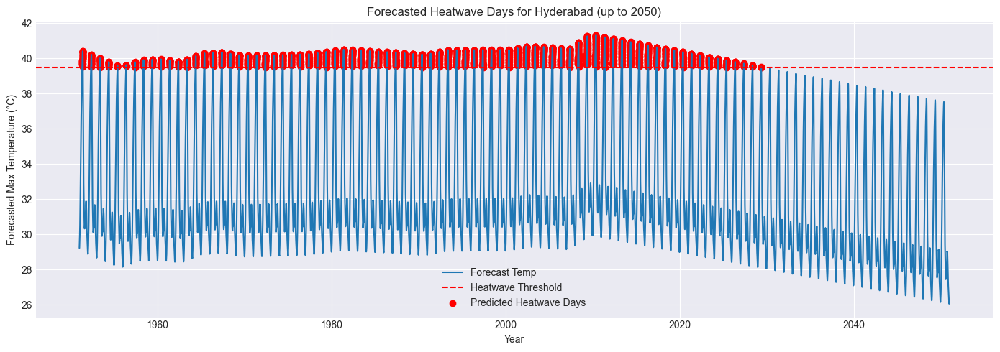


🔥 Forecasted Heatwave Days for Hyderabad (till 2050): 2297 days


13:52:14 - cmdstanpy - INFO - Chain [1] start processing
13:52:20 - cmdstanpy - INFO - Chain [1] done processing


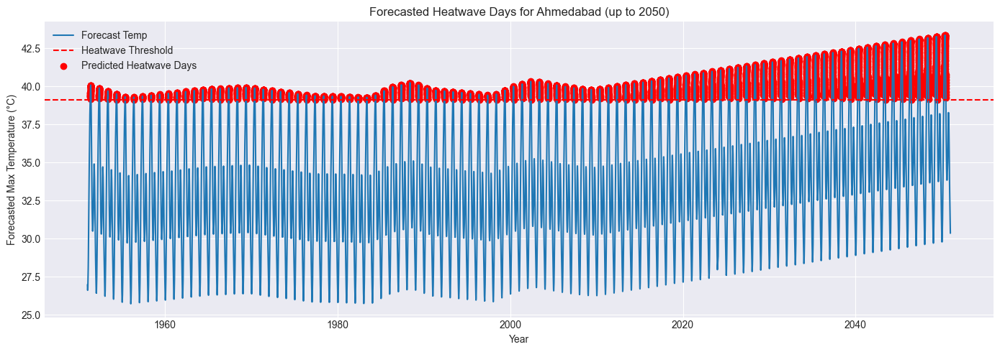


🔥 Forecasted Heatwave Days for Ahmedabad (till 2050): 4166 days


13:52:25 - cmdstanpy - INFO - Chain [1] start processing
13:52:31 - cmdstanpy - INFO - Chain [1] done processing


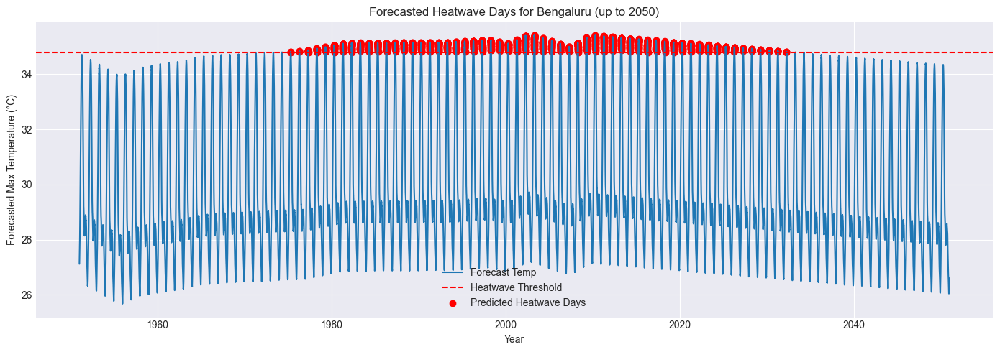


🔥 Forecasted Heatwave Days for Bengaluru (till 2050): 1699 days


13:52:37 - cmdstanpy - INFO - Chain [1] start processing
13:52:40 - cmdstanpy - INFO - Chain [1] done processing


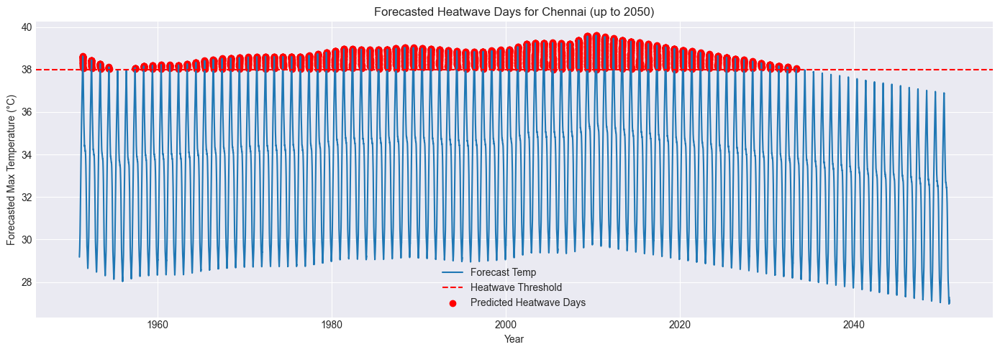


🔥 Forecasted Heatwave Days for Chennai (till 2050): 2159 days


13:52:46 - cmdstanpy - INFO - Chain [1] start processing
13:52:48 - cmdstanpy - INFO - Chain [1] done processing


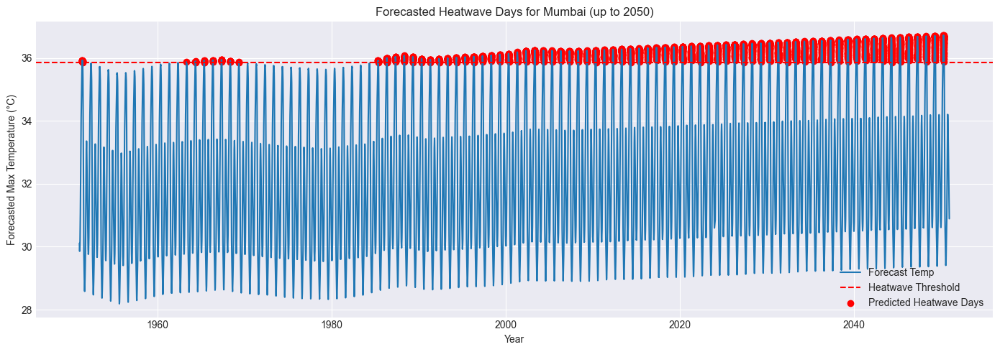


🔥 Forecasted Heatwave Days for Mumbai (till 2050): 2758 days


13:52:54 - cmdstanpy - INFO - Chain [1] start processing
13:52:59 - cmdstanpy - INFO - Chain [1] done processing


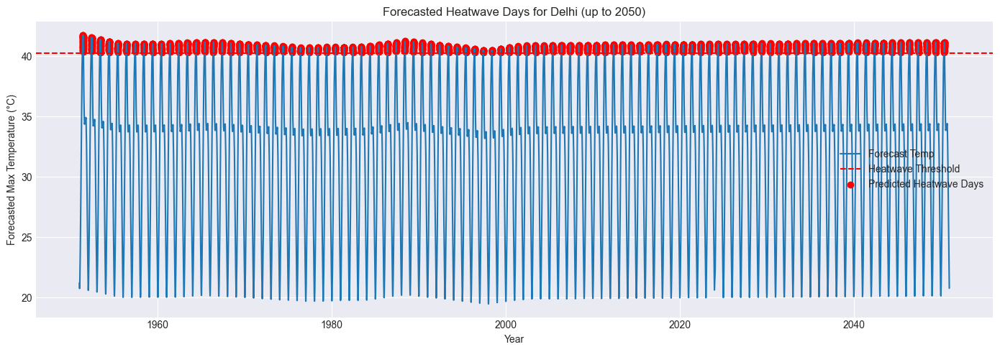


🔥 Forecasted Heatwave Days for Delhi (till 2050): 2515 days


In [18]:
from prophet import Prophet
import matplotlib.pyplot as plt

forecast_year = 2050
future_heatwave_summary = {}

for city, df in city_dataframes.items():
    # Prepare data
    df_prophet = df[['Date', 'Temp Max']].rename(columns={'Date':'ds', 'Temp Max':'y'})
    df_prophet['y'] = pd.to_numeric(df_prophet['y'], errors='coerce').ffill()

    # Fit Prophet model
    model = Prophet(yearly_seasonality=True)
    model.fit(df_prophet)

    # Create future dataframe until 2050
    last_date = df_prophet['ds'].max()
    periods = (pd.Timestamp(f"{forecast_year}-12-31") - last_date).days
    future = model.make_future_dataframe(periods=periods)

    # Forecast temperatures
    forecast = model.predict(future)
    forecast['Above_Threshold'] = forecast['yhat'] > heatwave_data[city]['Threshold']
    forecast['Heatwave'] = (forecast['Above_Threshold'].rolling(window=3).sum() == 3)

    future_heatwaves = forecast[forecast['Heatwave']]

    # Store summary
    future_heatwave_summary[city] = future_heatwaves[['ds', 'yhat']]

    # Plot heatwave forecast
    plt.figure(figsize=(14,5))
    plt.plot(forecast['ds'], forecast['yhat'], label='Forecast Temp')
    plt.axhline(heatwave_data[city]['Threshold'], color='r', linestyle='--', label='Heatwave Threshold')
    plt.scatter(future_heatwaves['ds'], future_heatwaves['yhat'], color='red', label='Predicted Heatwave Days')
    plt.title(f'Forecasted Heatwave Days for {city} (up to 2050)')
    plt.xlabel('Year')
    plt.ylabel('Forecasted Max Temperature (°C)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Summary of predicted heatwaves
    print(f"\n🔥 Forecasted Heatwave Days for {city} (till 2050): {len(future_heatwaves)} days")


## TRying Prophet

In [19]:
import pandas as pd
import numpy as np

heatwave_data = {}

for city, df in city_dataframes.items():
    # Ensure numeric data
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()

    # Calculate 90th percentile as threshold
    threshold = df['Temp Max'].quantile(0.90)

    # Identify days above threshold
    df['Above_Threshold'] = df['Temp Max'] > threshold

    # Identify heatwave events (3 or more consecutive days above threshold)
    df['Heatwave'] = (df['Above_Threshold'].rolling(window=3).sum() == 3)

    heatwave_days = df[df['Heatwave']]

    heatwave_data[city] = {
        'Threshold': threshold,
        'Total Heatwave Days': len(heatwave_days),
        'Heatwave Events': heatwave_days[['Date', 'Temp Max']]
    }

    print(f"\n🔥 {city}:")
    print(f" - Heatwave Threshold: {threshold:.2f}°C")
    print(f" - Historical Heatwave Days: {len(heatwave_days)}")



🔥 Hyderabad:
 - Heatwave Threshold: 39.49°C
 - Historical Heatwave Days: 1958

🔥 Ahmedabad:
 - Heatwave Threshold: 39.11°C
 - Historical Heatwave Days: 1881

🔥 Bengaluru:
 - Heatwave Threshold: 34.80°C
 - Historical Heatwave Days: 1805

🔥 Chennai:
 - Heatwave Threshold: 38.00°C
 - Historical Heatwave Days: 1673

🔥 Mumbai:
 - Heatwave Threshold: 35.85°C
 - Historical Heatwave Days: 1623

🔥 Delhi:
 - Heatwave Threshold: 40.30°C
 - Historical Heatwave Days: 1861


13:55:36 - cmdstanpy - INFO - Chain [1] start processing
13:55:42 - cmdstanpy - INFO - Chain [1] done processing


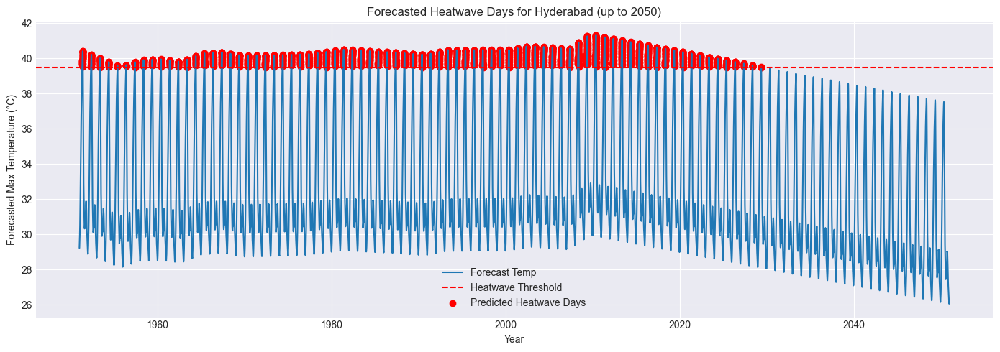


🔥 Forecasted Heatwave Days for Hyderabad (till 2050): 2297 days


13:55:48 - cmdstanpy - INFO - Chain [1] start processing
13:55:53 - cmdstanpy - INFO - Chain [1] done processing


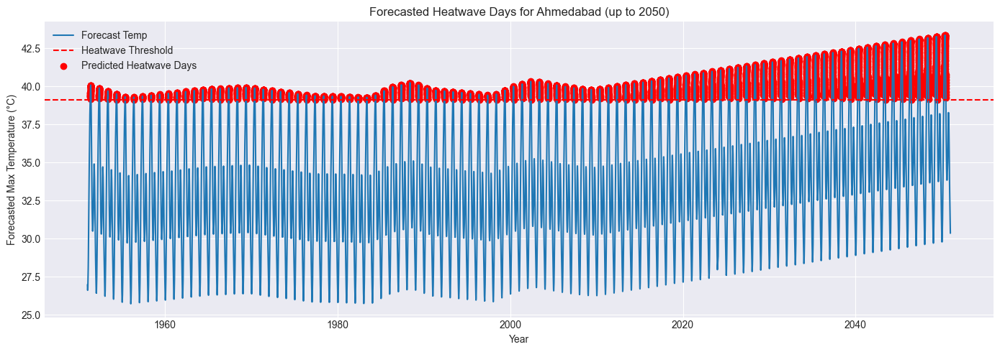


🔥 Forecasted Heatwave Days for Ahmedabad (till 2050): 4166 days


13:55:58 - cmdstanpy - INFO - Chain [1] start processing
13:56:04 - cmdstanpy - INFO - Chain [1] done processing


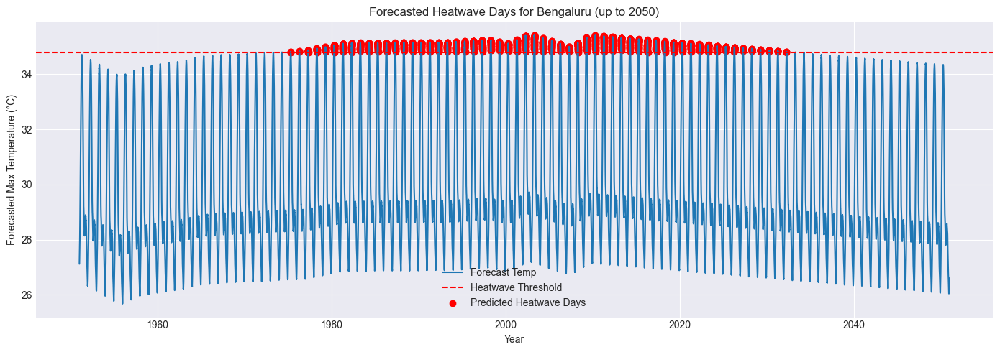


🔥 Forecasted Heatwave Days for Bengaluru (till 2050): 1699 days


13:56:10 - cmdstanpy - INFO - Chain [1] start processing
13:56:13 - cmdstanpy - INFO - Chain [1] done processing


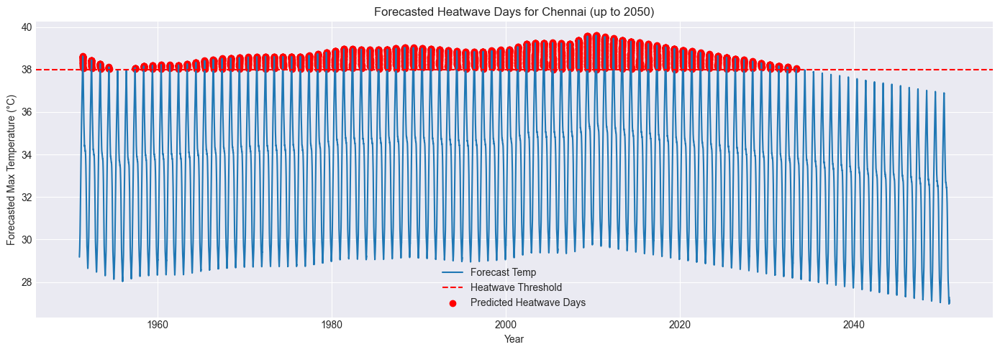


🔥 Forecasted Heatwave Days for Chennai (till 2050): 2159 days


13:56:19 - cmdstanpy - INFO - Chain [1] start processing
13:56:21 - cmdstanpy - INFO - Chain [1] done processing


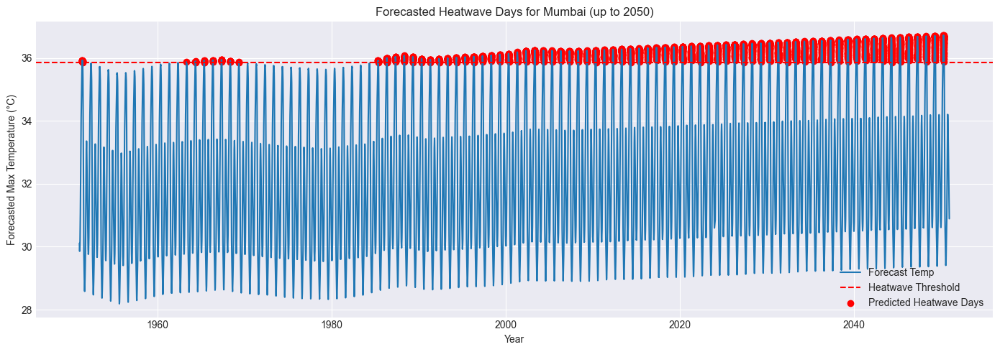


🔥 Forecasted Heatwave Days for Mumbai (till 2050): 2758 days


13:56:27 - cmdstanpy - INFO - Chain [1] start processing
13:56:32 - cmdstanpy - INFO - Chain [1] done processing


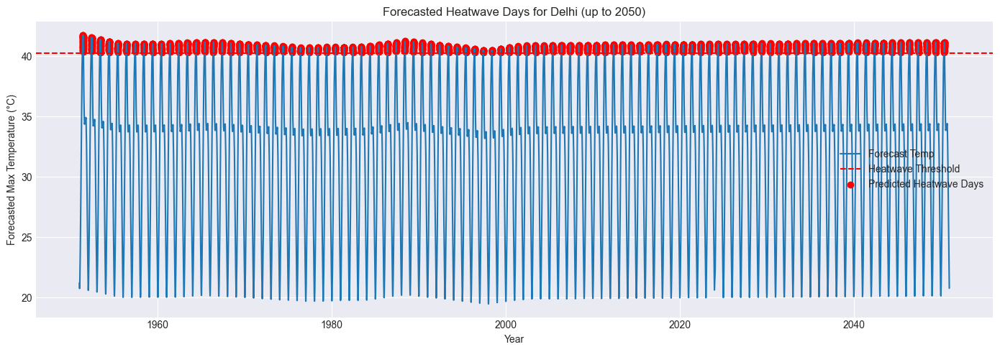


🔥 Forecasted Heatwave Days for Delhi (till 2050): 2515 days


In [20]:
from prophet import Prophet
import matplotlib.pyplot as plt

forecast_year = 2050
future_heatwave_summary = {}

for city, df in city_dataframes.items():
    # Prepare data
    df_prophet = df[['Date', 'Temp Max']].rename(columns={'Date':'ds', 'Temp Max':'y'})
    df_prophet['y'] = pd.to_numeric(df_prophet['y'], errors='coerce').ffill()

    # Fit Prophet model
    model = Prophet(yearly_seasonality=True)
    model.fit(df_prophet)

    # Create future dataframe until 2050
    last_date = df_prophet['ds'].max()
    periods = (pd.Timestamp(f"{forecast_year}-12-31") - last_date).days
    future = model.make_future_dataframe(periods=periods)

    # Forecast temperatures
    forecast = model.predict(future)
    forecast['Above_Threshold'] = forecast['yhat'] > heatwave_data[city]['Threshold']
    forecast['Heatwave'] = (forecast['Above_Threshold'].rolling(window=3).sum() == 3)

    future_heatwaves = forecast[forecast['Heatwave']]

    # Store summary
    future_heatwave_summary[city] = future_heatwaves[['ds', 'yhat']]

    # Plot heatwave forecast
    plt.figure(figsize=(14,5))
    plt.plot(forecast['ds'], forecast['yhat'], label='Forecast Temp')
    plt.axhline(heatwave_data[city]['Threshold'], color='r', linestyle='--', label='Heatwave Threshold')
    plt.scatter(future_heatwaves['ds'], future_heatwaves['yhat'], color='red', label='Predicted Heatwave Days')
    plt.title(f'Forecasted Heatwave Days for {city} (up to 2050)')
    plt.xlabel('Year')
    plt.ylabel('Forecasted Max Temperature (°C)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Summary of predicted heatwaves
    print(f"\n🔥 Forecasted Heatwave Days for {city} (till 2050): {len(future_heatwaves)} days")


# Calculating Relative Humidity

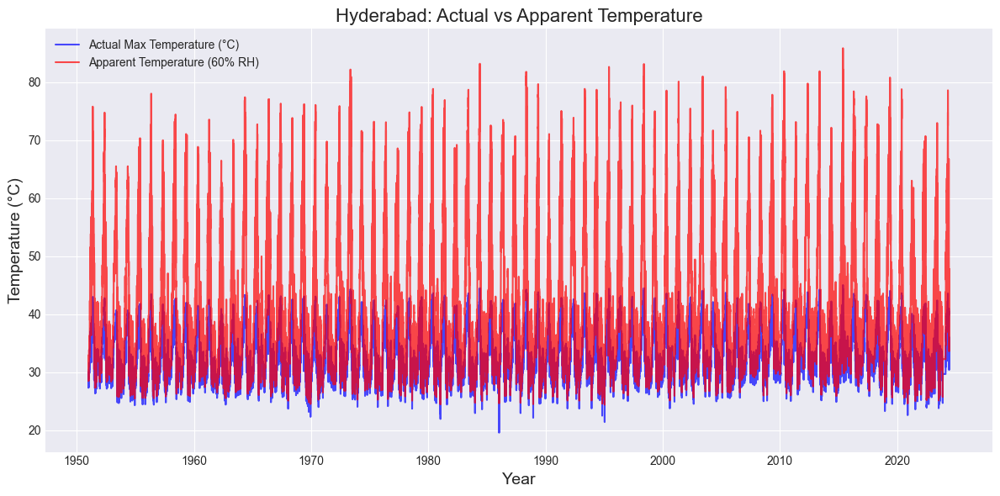

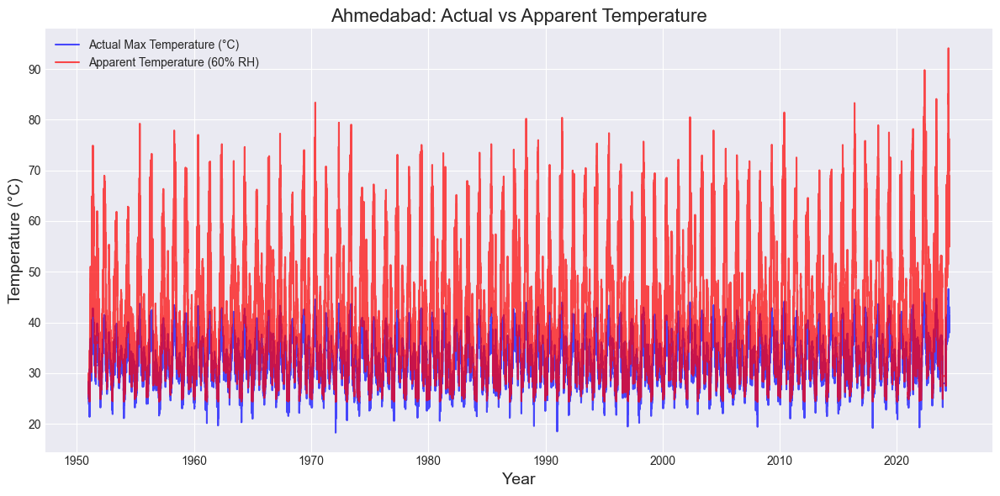

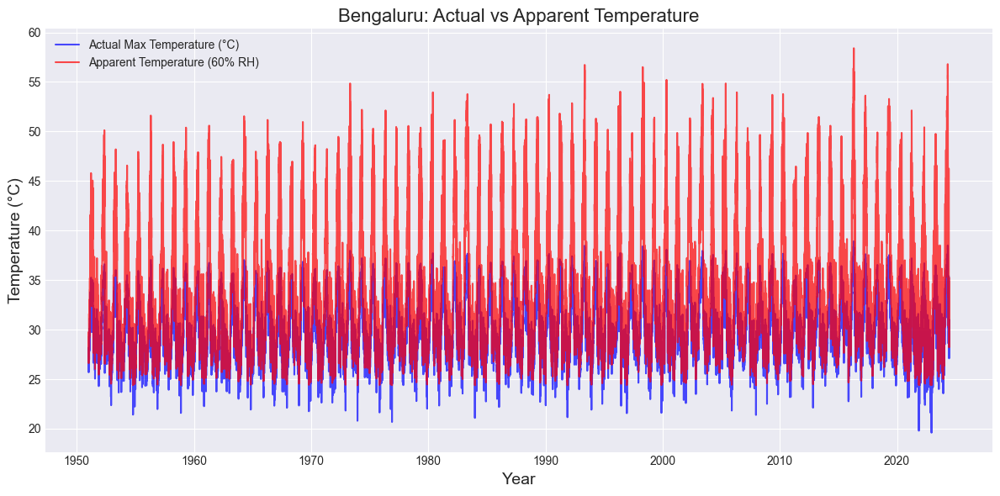

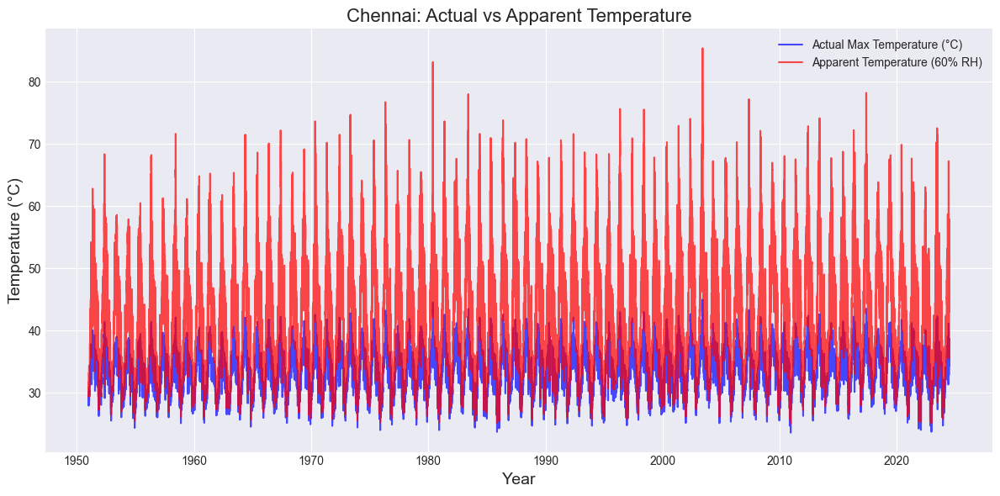

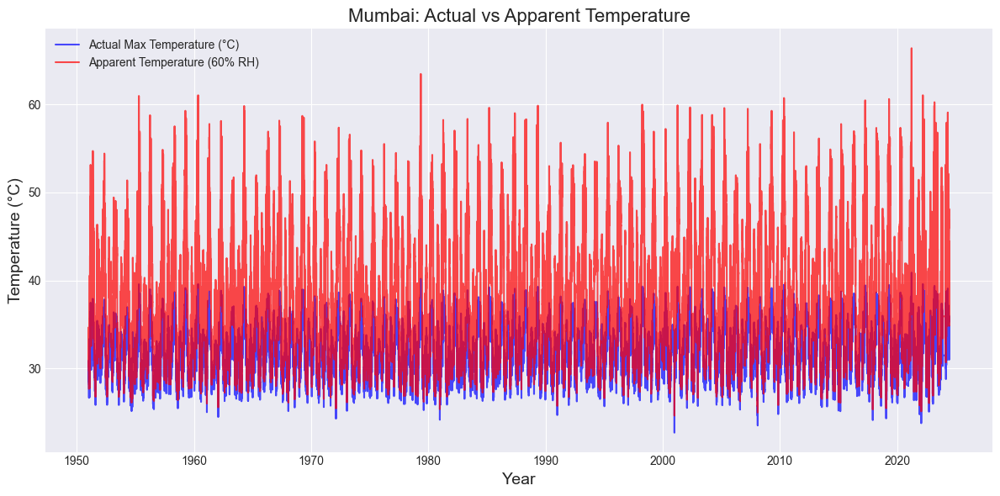

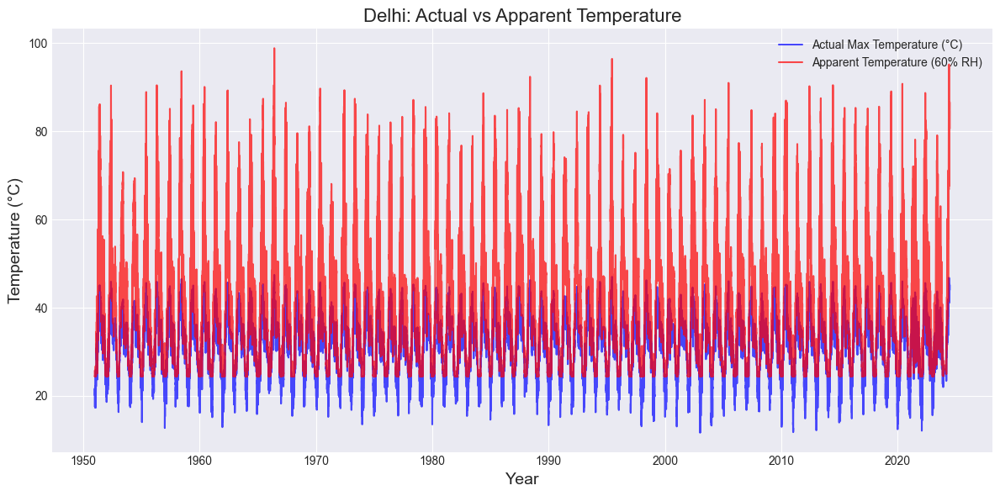

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Function to calculate heat index
def calculate_heat_index(T, RH):
    HI = (-8.784695 + 1.61139411 * T + 2.338549 * RH - 0.14611605 * T * RH - 
          0.012308094 * T**2 - 0.016424828 * RH**2 + 0.002211732 * T**2 * RH + 
          0.00072546 * T * RH**2 - 0.000003582 * T**2 * RH**2)
    return HI

# Example visualization for each city (assuming 60% RH)
humidity = 60

for city, df in city_dataframes.items():
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()
    df['Apparent Temp'] = calculate_heat_index(df['Temp Max'], humidity)

    # Visualize real vs apparent temperature
    plt.figure(figsize=(12, 6))
    plt.plot(df['Date'], df['Temp Max'], label='Actual Max Temperature (°C)', color='blue', alpha=0.7)
    plt.plot(df['Date'], df['Apparent Temp'], label=f'Apparent Temperature (60% RH)', color='red', alpha=0.7)

    plt.title(f'{city}: Actual vs Apparent Temperature', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Temperature (°C)', fontsize=14)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


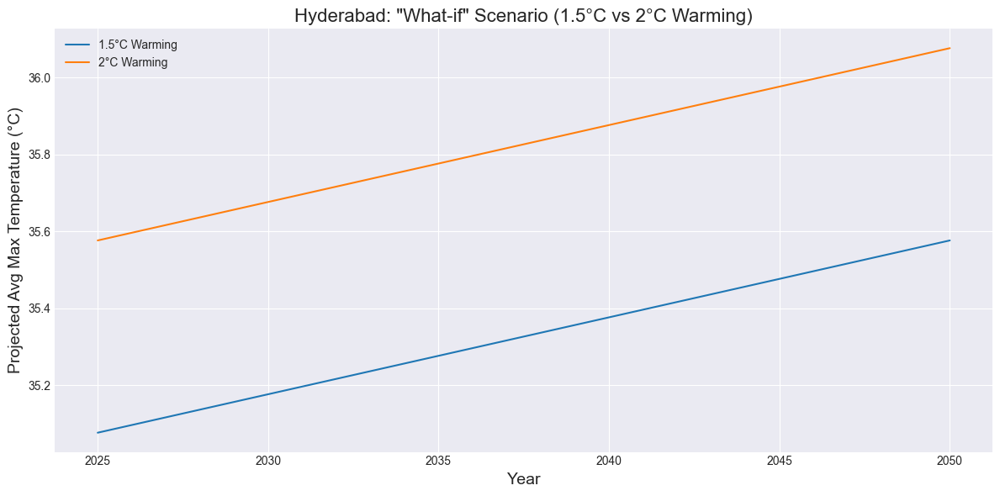

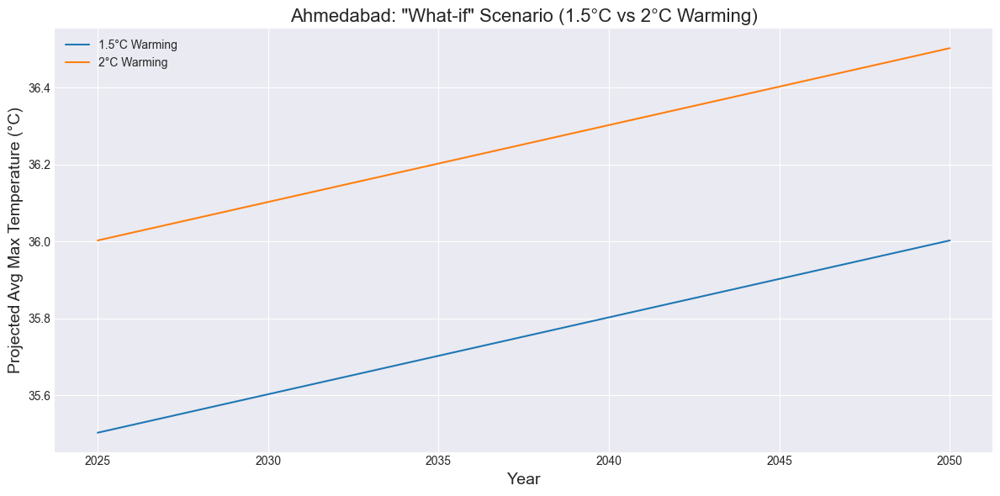

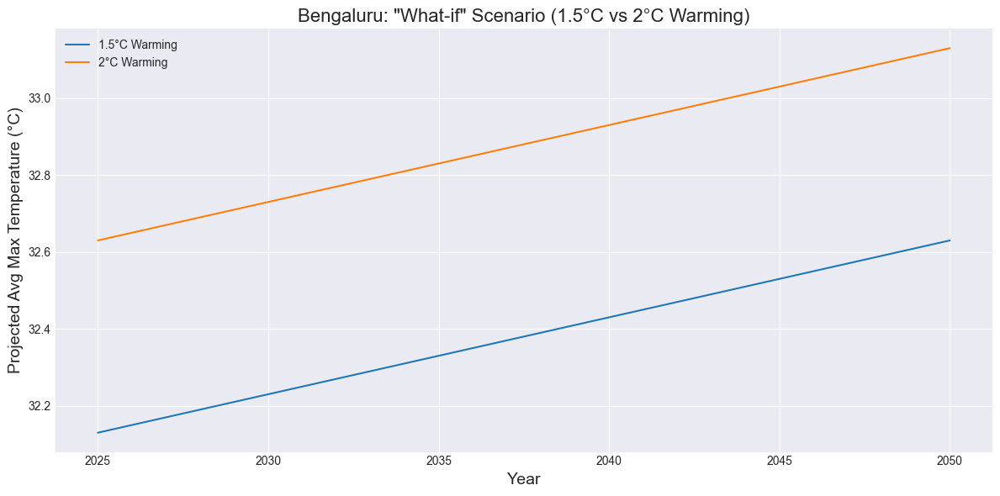

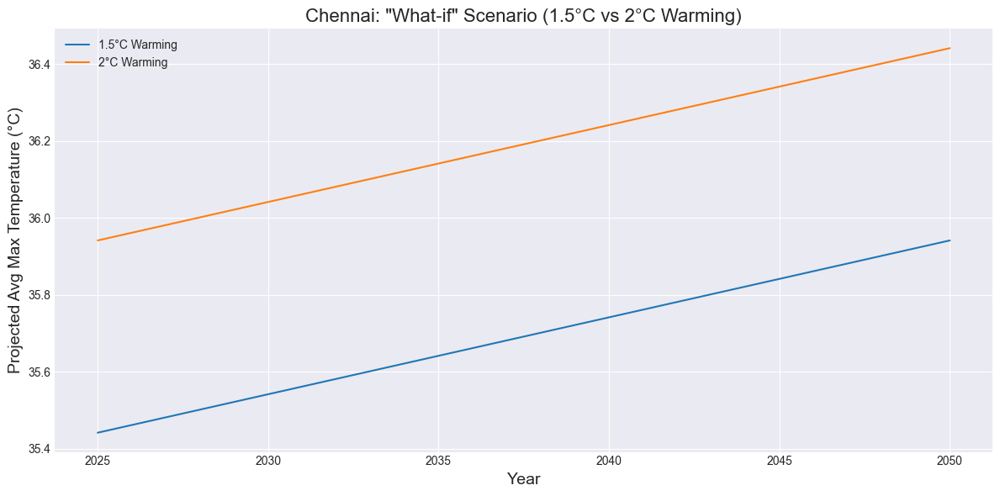

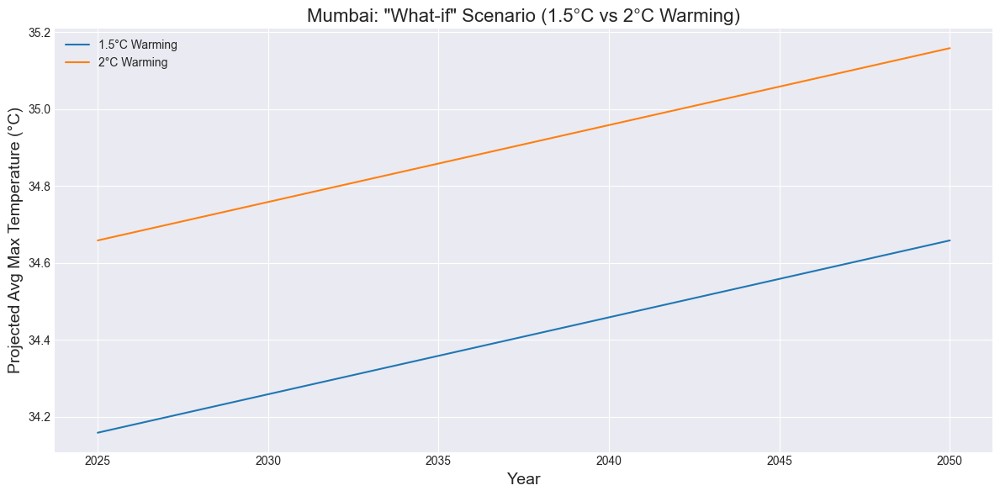

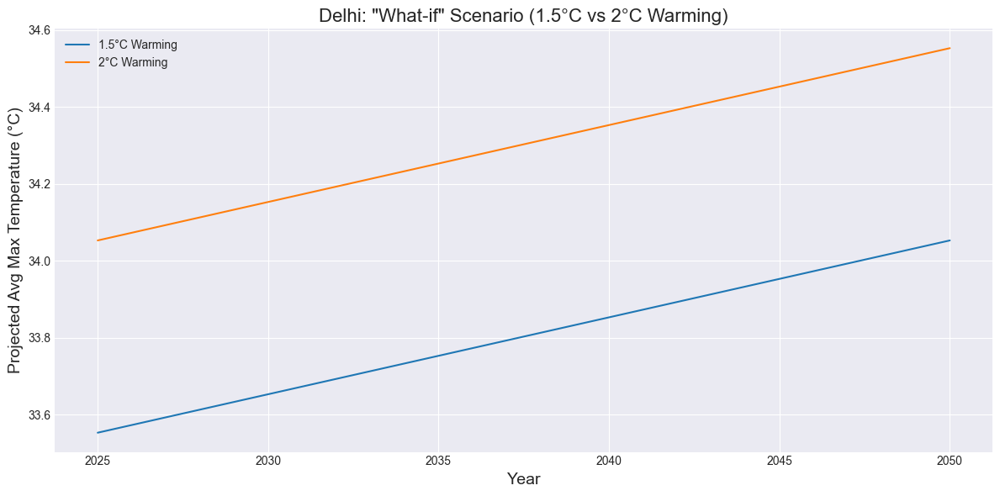

In [22]:
#Scenario analysis
import matplotlib.pyplot as plt
import pandas as pd

scenarios = {'1.5°C Warming': 1.5, '2°C Warming': 2.0}
forecast_years = range(2025, 2051)

for city, df in city_dataframes.items():
    df['Year'] = df['Date'].dt.year
    historical_avg = df.groupby('Year')['Temp Max'].mean()
    recent_temp = historical_avg[-10:].mean()  # average recent temperature as baseline

    plt.figure(figsize=(12, 6))

    for scenario, increase in scenarios.items():
        projected_temps = [recent_temp + increase + 0.02*(year-2025) for year in forecast_years]  # assuming gradual additional warming (0.02°C/year)
        plt.plot(forecast_years, projected_temps, label=scenario)

    plt.title(f'{city}: "What-if" Scenario (1.5°C vs 2°C Warming)', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Projected Avg Max Temperature (°C)', fontsize=14)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


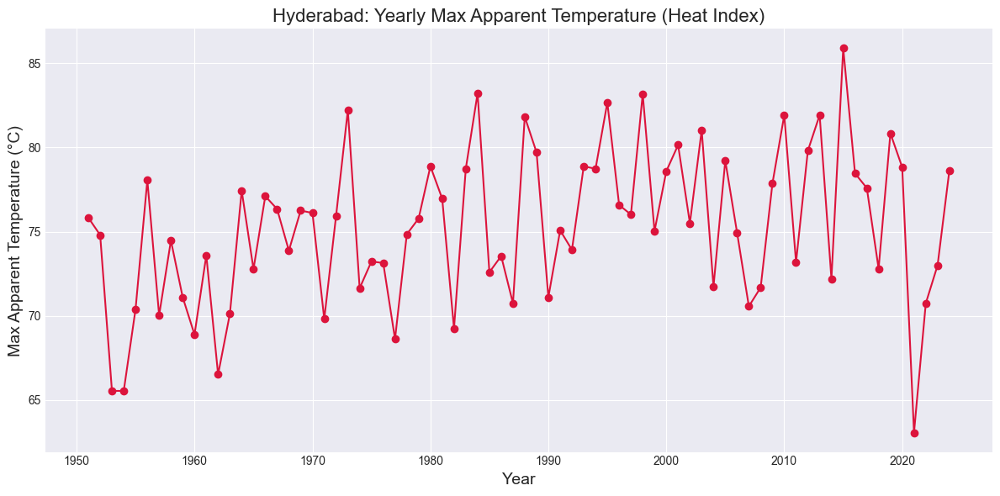

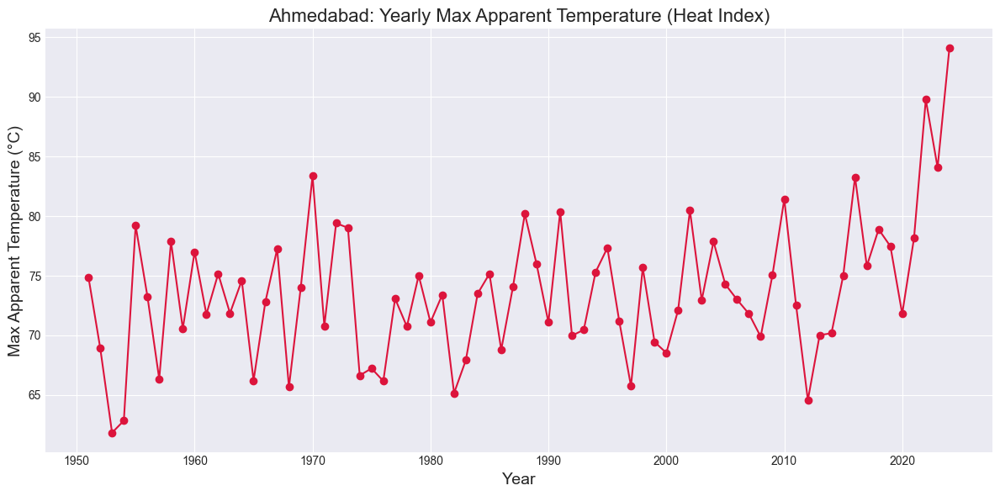

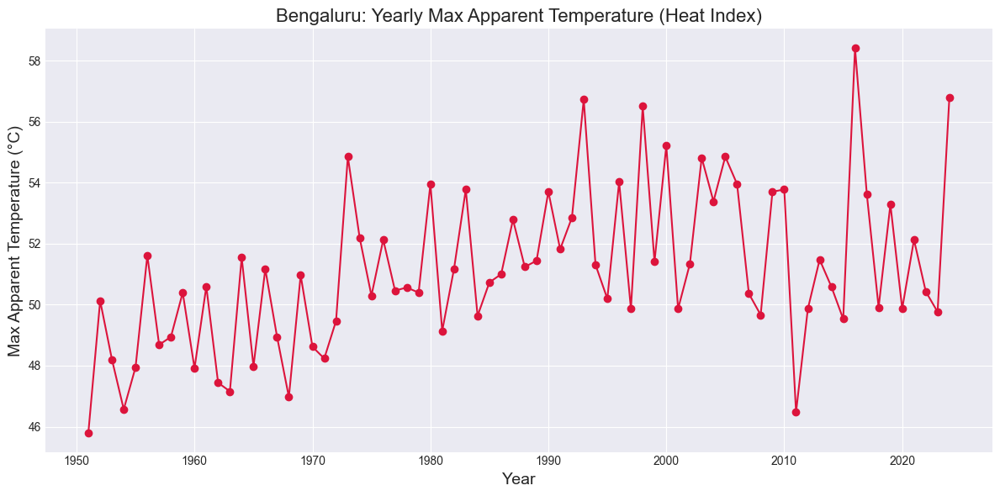

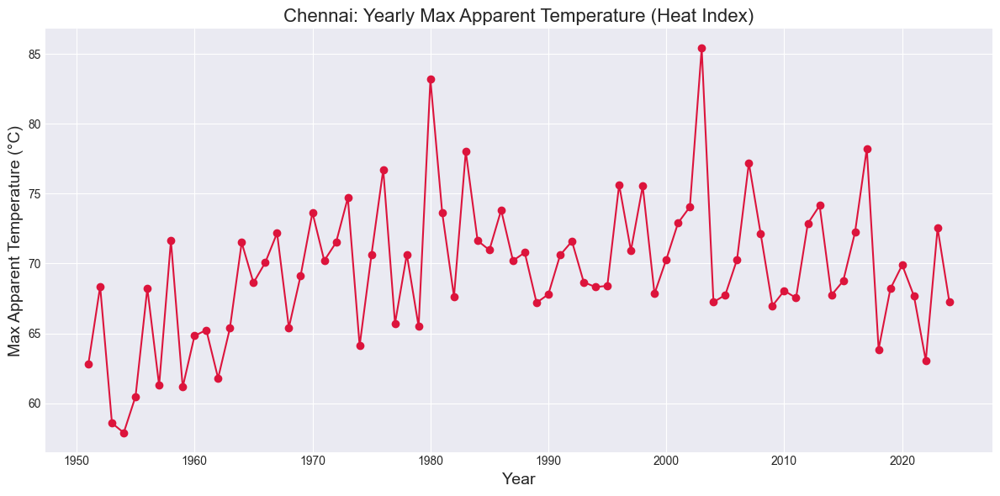

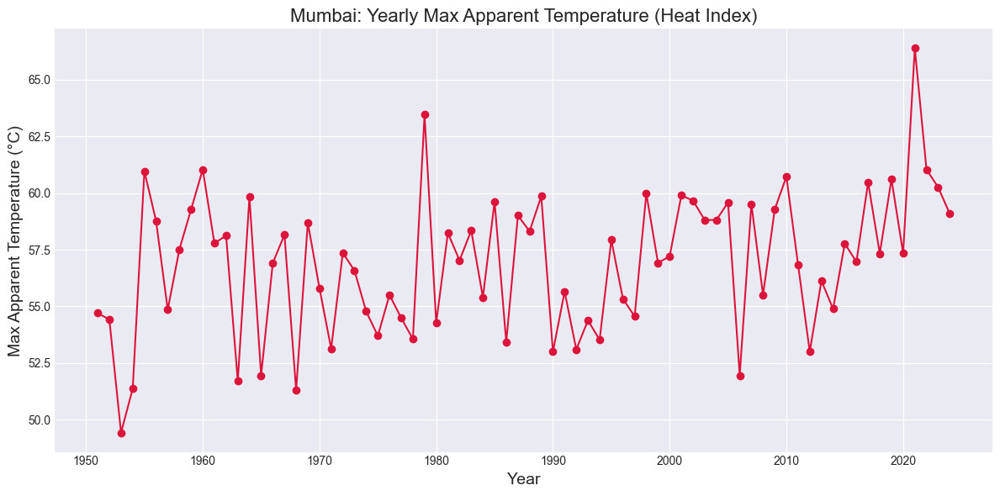

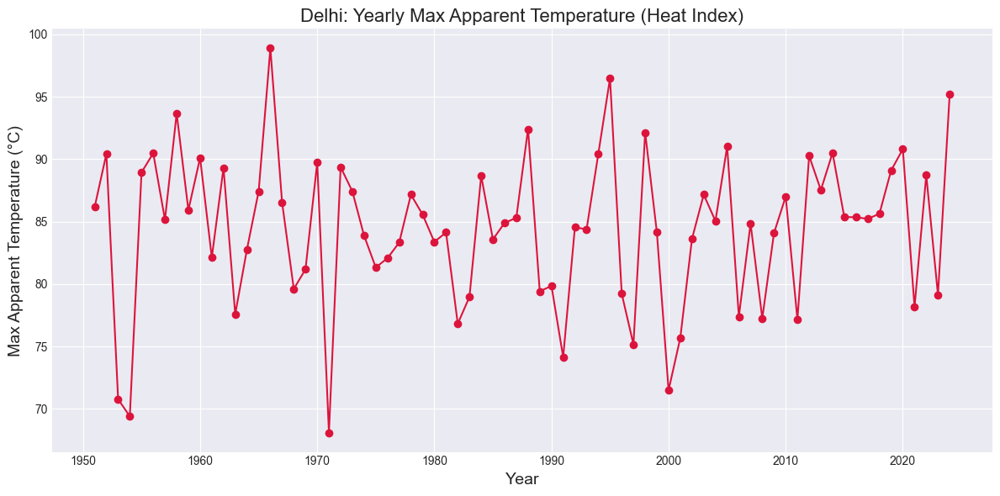

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Function to calculate Apparent Temperature (Heat Index)
def calculate_heat_index(T, RH):
    HI = (-8.784695 + 1.61139411 * T + 2.338549 * RH - 0.14611605 * T * RH - 
          0.012308094 * T**2 - 0.016424828 * RH**2 + 0.002211732 * T**2 * RH + 
          0.00072546 * T * RH**2 - 0.000003582 * T**2 * RH**2)
    return HI

# Assume average humidity
avg_humidity = 60  

# Calculate and plot max apparent temperature year-on-year
for city, df in city_dataframes.items():
    # Ensure numeric temperatures
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()
    
    # Calculate Apparent Temperature
    df['Apparent Temp'] = calculate_heat_index(df['Temp Max'], avg_humidity)
    
    # Extract year and group by year to find max apparent temperature
    df['Year'] = df['Date'].dt.year
    yearly_max_apparent_temp = df.groupby('Year')['Apparent Temp'].max()

    # Plot yearly max apparent temperature
    plt.figure(figsize=(12, 6))
    plt.plot(yearly_max_apparent_temp.index, yearly_max_apparent_temp.values, marker='o', color='crimson')
    
    plt.title(f'{city}: Yearly Max Apparent Temperature (Heat Index)', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Max Apparent Temperature (°C)', fontsize=14)
    plt.grid(True)
    plt.tight_layout()
    plt.show()



Analyzing rainfall & heatwaves for Hyderabad...


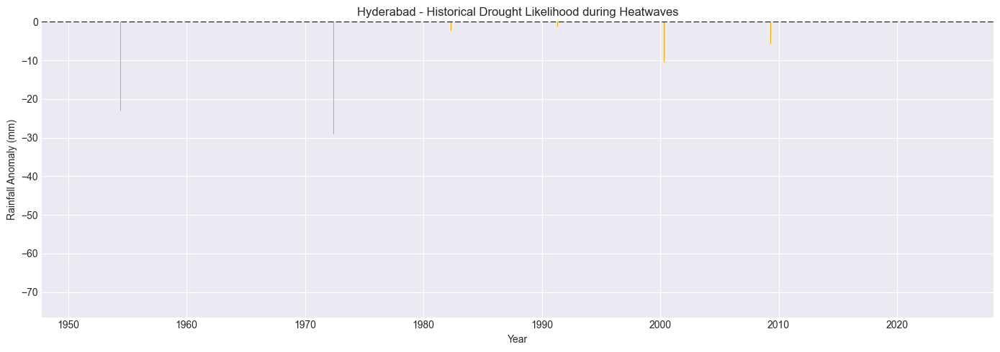

 - Total drought-risk months identified: 122


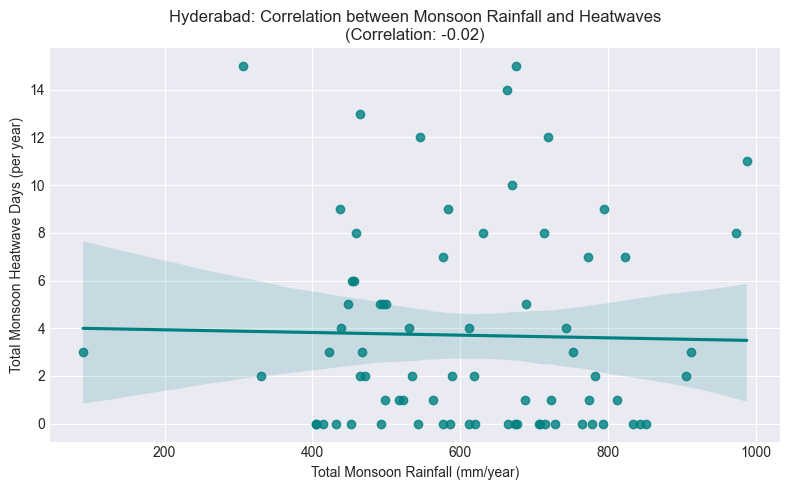

 - Correlation (Monsoon Rainfall vs Heatwave Frequency): -0.02
 - Insight: Lower monsoon rainfall correlates with higher heatwave frequency, indicating higher water scarcity risk.

Analyzing rainfall & heatwaves for Ahmedabad...


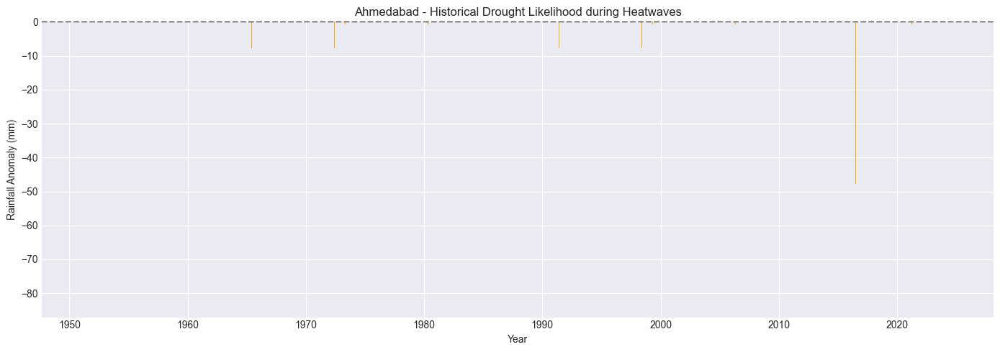

 - Total drought-risk months identified: 162


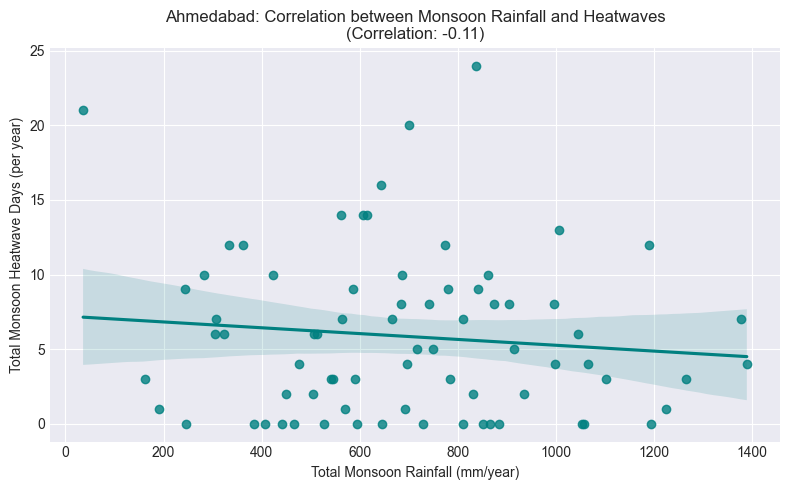

 - Correlation (Monsoon Rainfall vs Heatwave Frequency): -0.11
 - Insight: Lower monsoon rainfall correlates with higher heatwave frequency, indicating higher water scarcity risk.

Analyzing rainfall & heatwaves for Bengaluru...


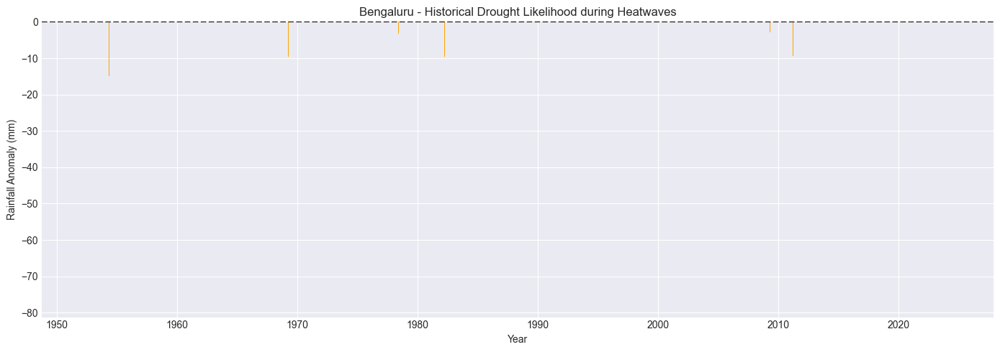

 - Total drought-risk months identified: 137


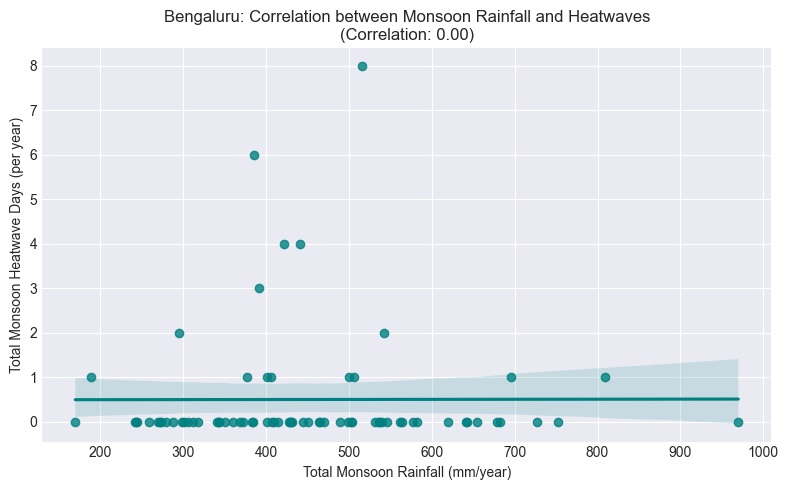

 - Correlation (Monsoon Rainfall vs Heatwave Frequency): 0.00
 - Insight: No strong negative correlation observed; water scarcity risk less directly linked to heatwave frequency.

Analyzing rainfall & heatwaves for Chennai...


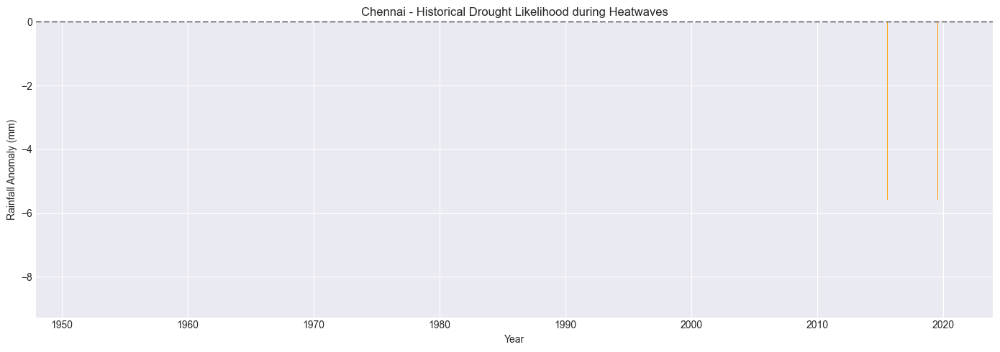

 - Total drought-risk months identified: 206


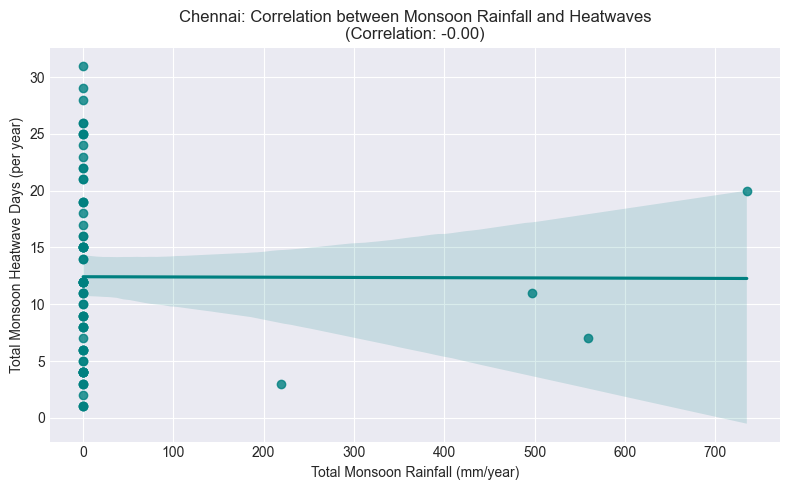

 - Correlation (Monsoon Rainfall vs Heatwave Frequency): -0.00
 - Insight: Lower monsoon rainfall correlates with higher heatwave frequency, indicating higher water scarcity risk.

Analyzing rainfall & heatwaves for Mumbai...


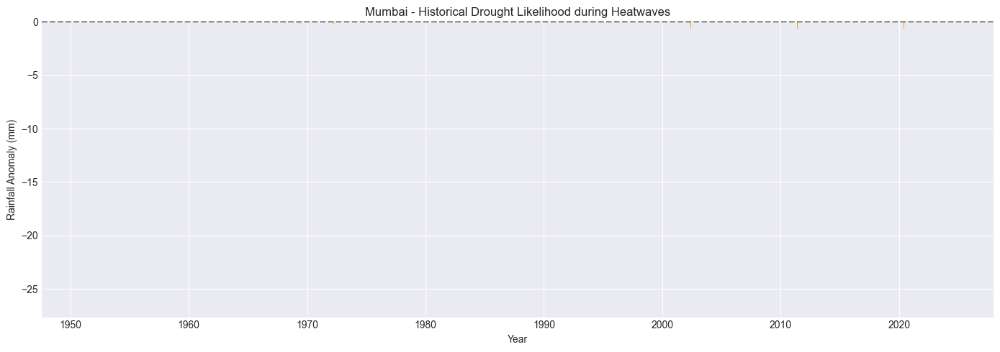

 - Total drought-risk months identified: 213


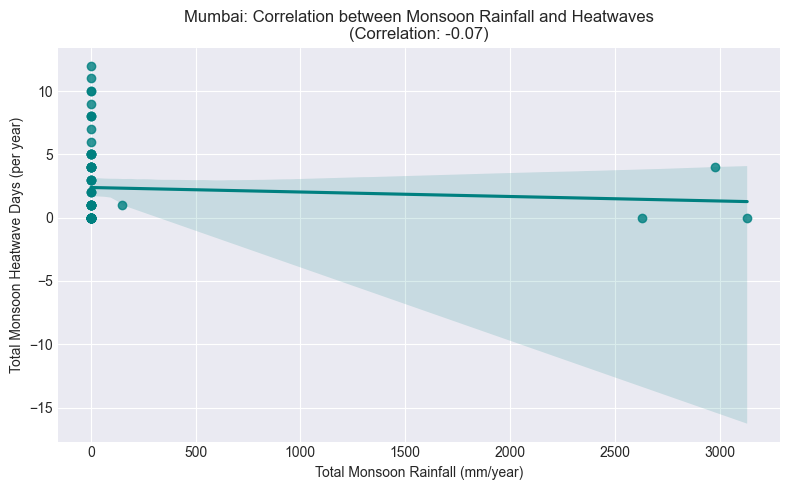

 - Correlation (Monsoon Rainfall vs Heatwave Frequency): -0.07
 - Insight: Lower monsoon rainfall correlates with higher heatwave frequency, indicating higher water scarcity risk.

Analyzing rainfall & heatwaves for Delhi...


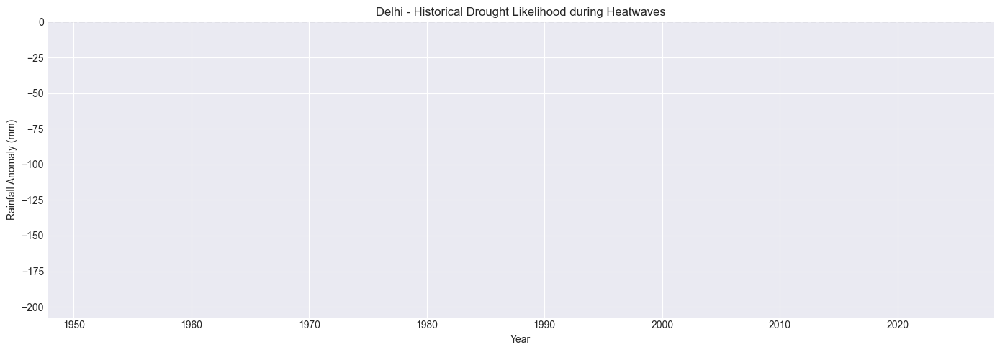

 - Total drought-risk months identified: 140


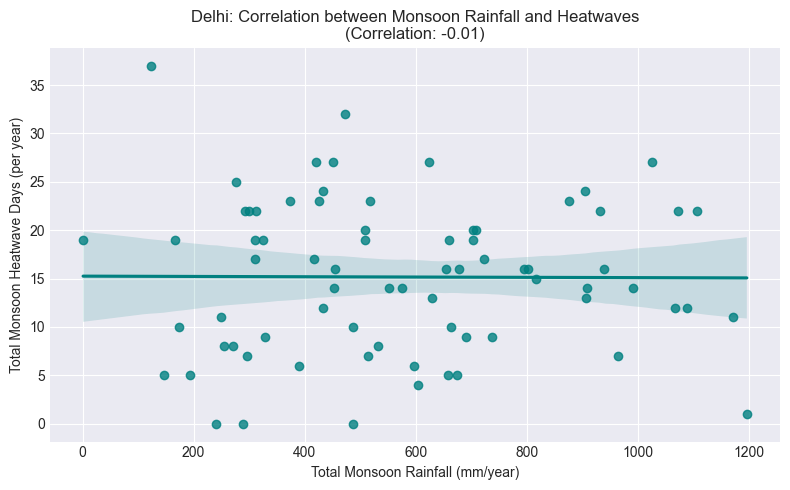

 - Correlation (Monsoon Rainfall vs Heatwave Frequency): -0.01
 - Insight: Lower monsoon rainfall correlates with higher heatwave frequency, indicating higher water scarcity risk.


In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
plt.style.use('seaborn-v0_8-darkgrid')

for city, df in city_dataframes.items():
    print(f"\nAnalyzing rainfall & heatwaves for {city}...")

    # Ensure numeric and clean data
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()
    df['Rain'] = pd.to_numeric(df['Rain'], errors='coerce').fillna(0)

    # Determine heatwave threshold (90th percentile)
    heatwave_thresh = df['Temp Max'].quantile(0.90)
    df['Heatwave'] = (df['Temp Max'] >= heatwave_thresh).astype(int)

    # Resample to monthly rainfall and heatwave frequency
    monthly = df.set_index('Date').resample('M').agg({
        'Rain': 'sum',
        'Heatwave': 'sum'
    })

    # Monthly rainfall anomaly (compared to historical monthly avg)
    monthly['Month'] = monthly.index.month
    monthly_avg_rain = monthly.groupby('Month')['Rain'].transform('mean')
    monthly['Rain_Anomaly'] = monthly['Rain'] - monthly_avg_rain

    # Identify drought-risk months (heatwave months with negative rainfall anomaly)
    monthly['Drought_Risk'] = ((monthly['Heatwave'] >= 3) & (monthly['Rain_Anomaly'] < 0)).astype(int)

    drought_months = monthly[monthly['Drought_Risk'] == 1]

    # Plot drought-risk months
    plt.figure(figsize=(14,5))
    plt.bar(drought_months.index, drought_months['Rain_Anomaly'], color='orange')
    plt.axhline(0, color='black', linestyle='--')
    plt.title(f"{city} - Historical Drought Likelihood during Heatwaves")
    plt.xlabel('Year')
    plt.ylabel('Rainfall Anomaly (mm)')
    plt.tight_layout()
    plt.show()

    print(f" - Total drought-risk months identified: {len(drought_months)}")

    # ---- Step 2: Correlating Heatwaves with Monsoon Variability ----

    # Define monsoon season (June-September)
    monsoon = monthly[monthly.index.month.isin([6,7,8,9])]
    annual_monsoon = monsoon.resample('Y').agg({
        'Rain': 'sum',
        'Heatwave': 'sum'
    })

    # Correlation analysis
    corr = annual_monsoon['Rain'].corr(annual_monsoon['Heatwave'])

    # Plot correlation clearly
    plt.figure(figsize=(8,5))
    sns.regplot(x='Rain', y='Heatwave', data=annual_monsoon, color='teal')
    plt.title(f"{city}: Correlation between Monsoon Rainfall and Heatwaves\n(Correlation: {corr:.2f})")
    plt.xlabel('Total Monsoon Rainfall (mm/year)')
    plt.ylabel('Total Monsoon Heatwave Days (per year)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    print(f" - Correlation (Monsoon Rainfall vs Heatwave Frequency): {corr:.2f}")
    if corr < 0:
        print(" - Insight: Lower monsoon rainfall correlates with higher heatwave frequency, indicating higher water scarcity risk.")
    else:
        print(" - Insight: No strong negative correlation observed; water scarcity risk less directly linked to heatwave frequency.")



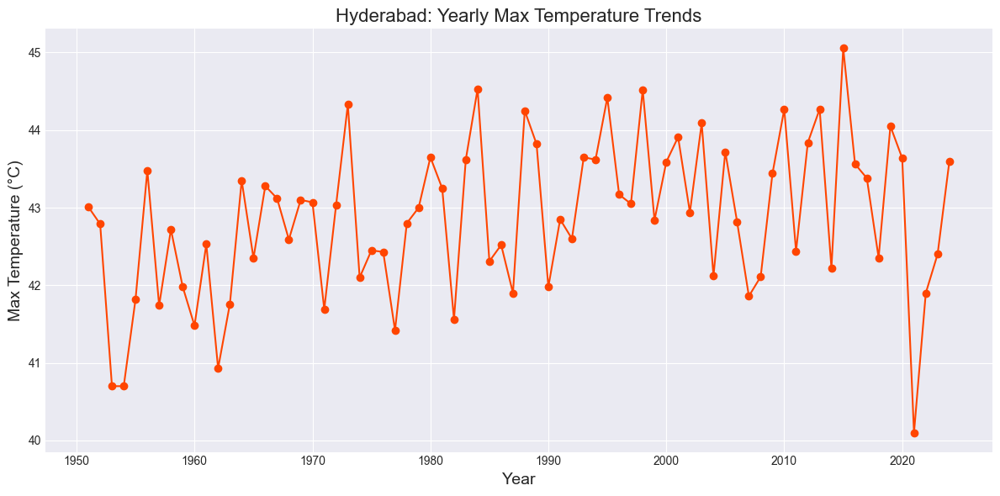

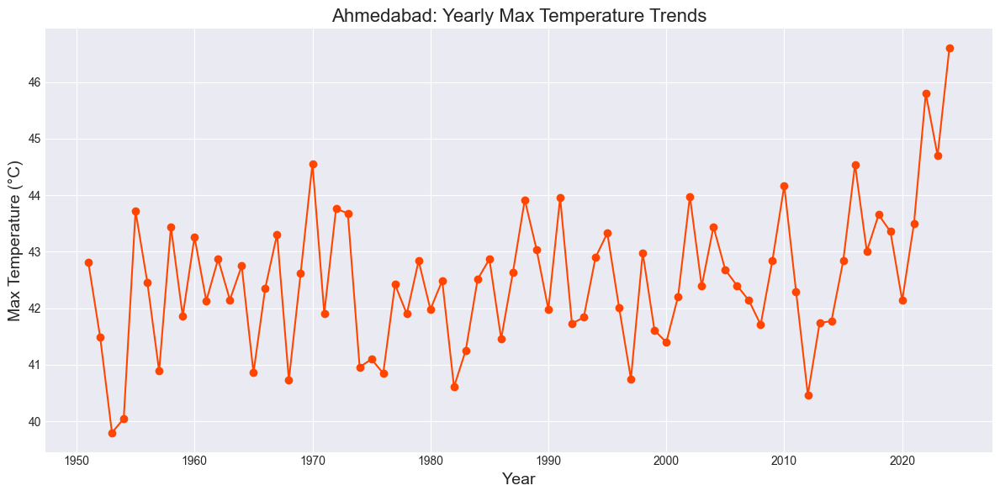

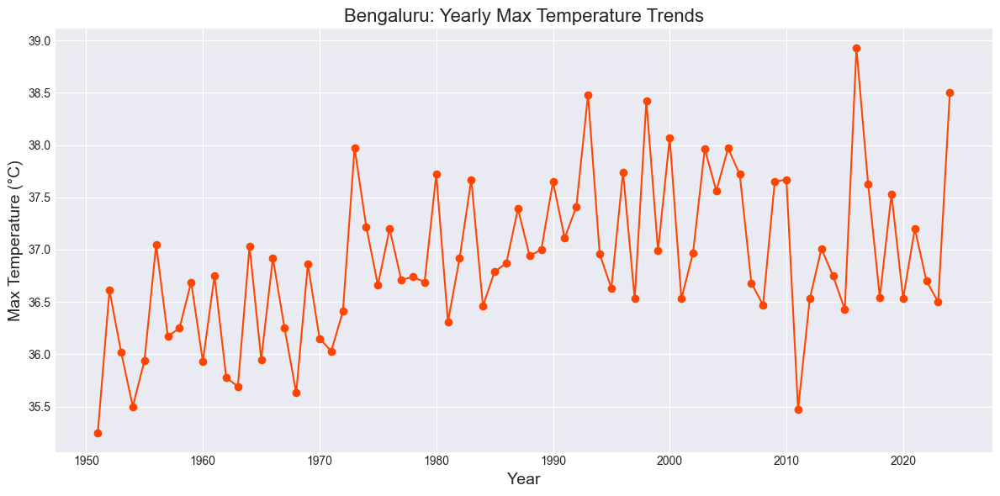

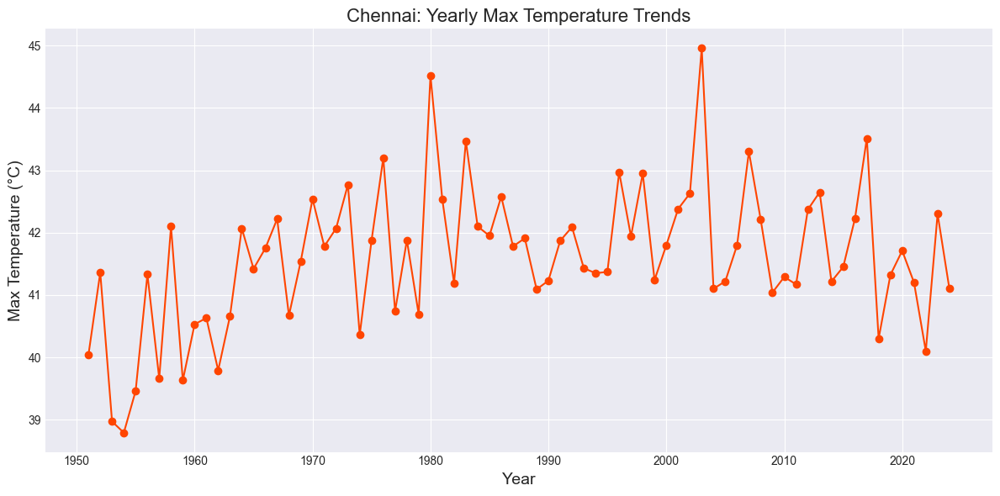

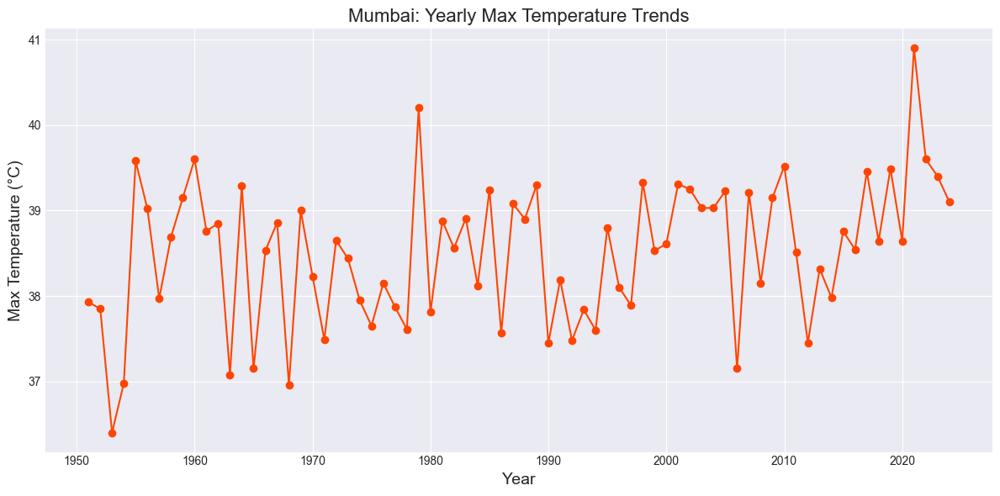

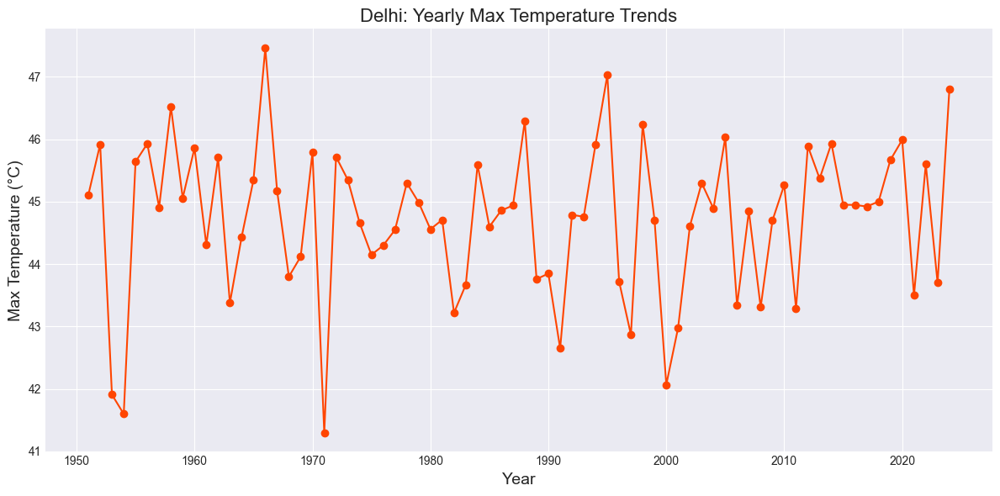

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

plt.style.use('seaborn-v0_8-darkgrid')

for city, df in city_dataframes.items():
    # Ensure temperatures are numeric
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()
    
    # Calculate the yearly maximum temperature
    df['Year'] = df['Date'].dt.year
    yearly_max_temp = df.groupby('Year')['Temp Max'].max()

    # Plot the graph
    plt.figure(figsize=(12,6))
    plt.plot(yearly_max_temp.index, yearly_max_temp.values, marker='o', linestyle='-', color='orangered')
    
    plt.title(f'{city}: Yearly Max Temperature Trends', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Max Temperature (°C)', fontsize=14)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


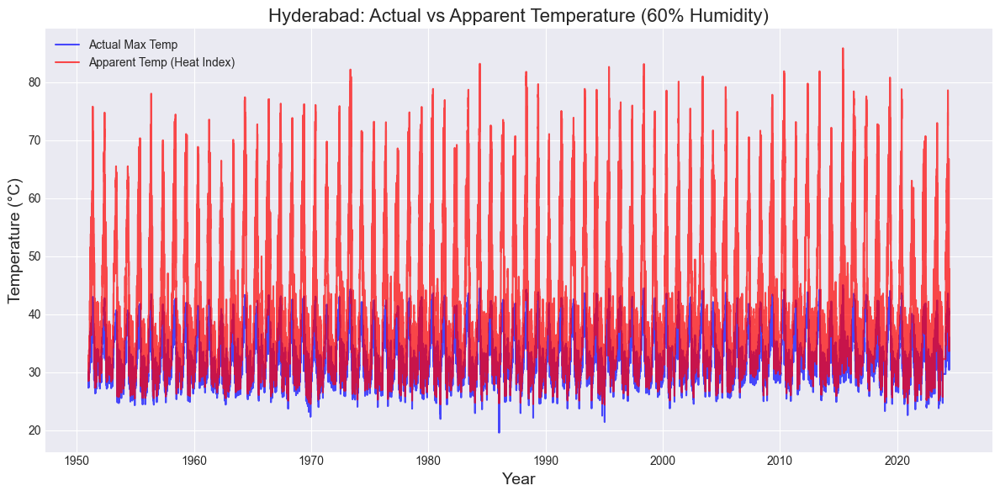

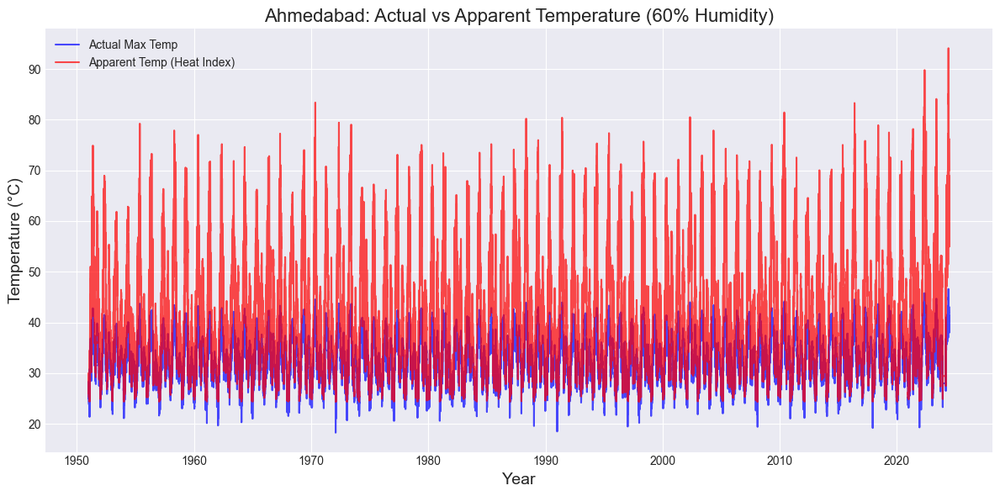

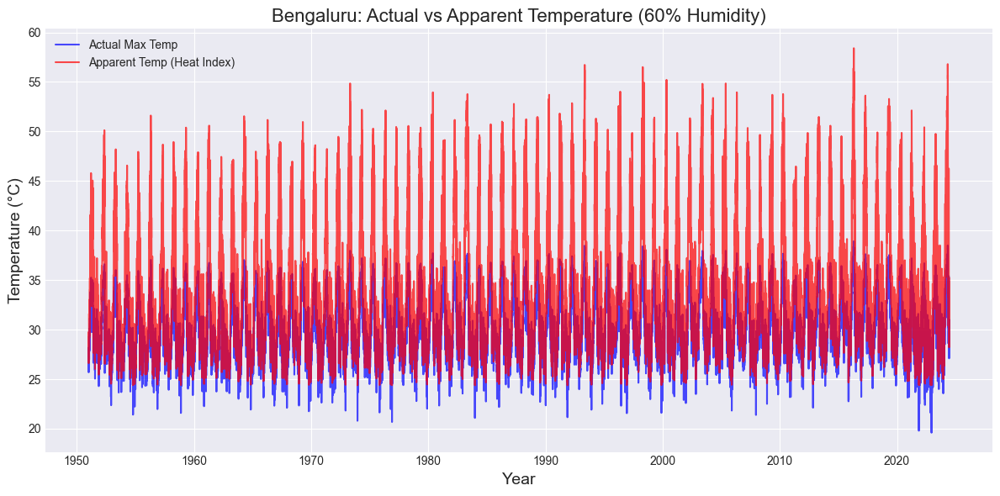

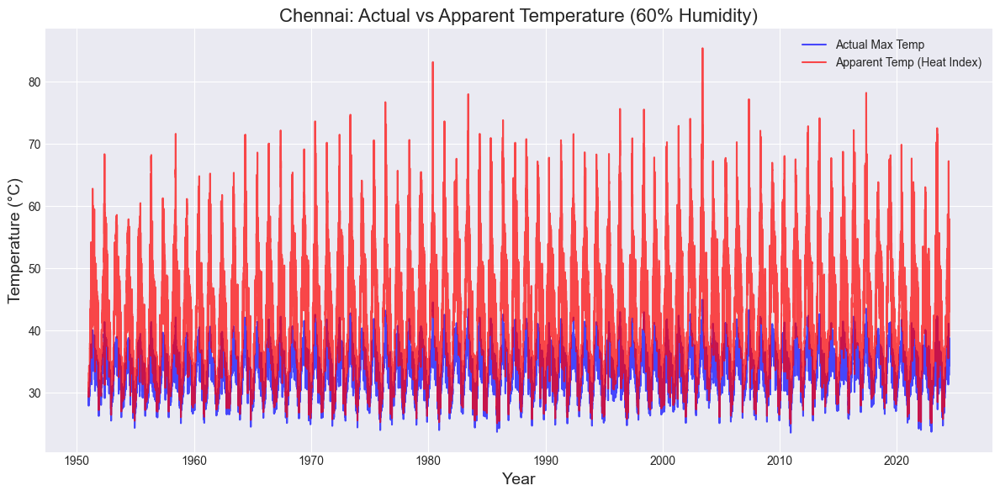

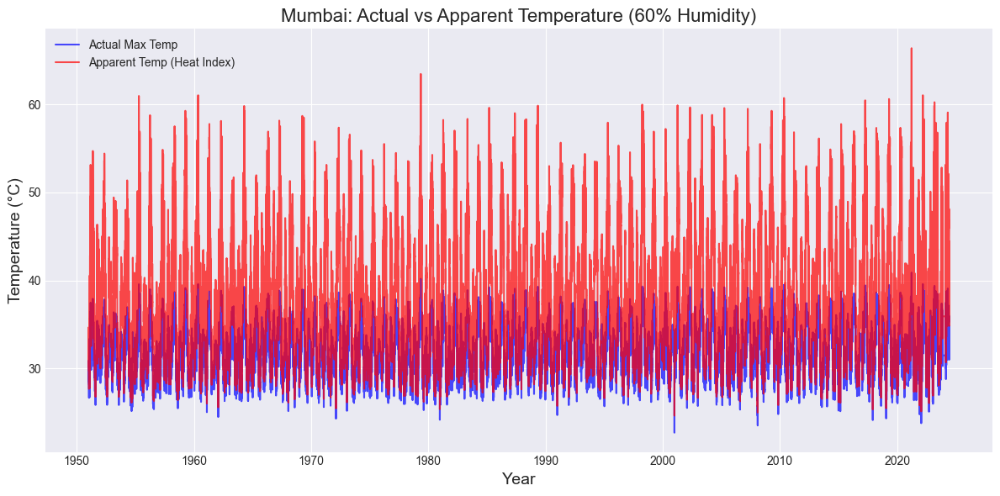

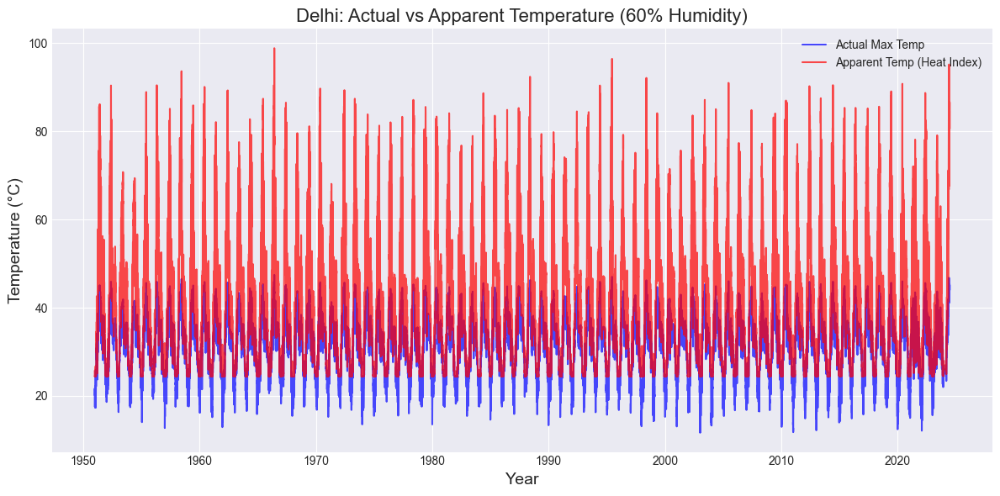

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define the function to calculate Heat Index (Apparent Temperature)
def calculate_heat_index(T, RH):
    HI = (-8.784695 + (1.61139411 * T) + (2.338549 * RH) - 
          (0.14611605 * T * RH) - (0.012308094 * T**2) - 
          (0.016424828 * RH**2) + (0.002211732 * T**2 * RH) + 
          (0.00072546 * T * RH**2) - (0.000003582 * T**2 * RH**2))
    return HI

# Assume average relative humidity of 60%
average_humidity = 60

for city, df in city_dataframes.items():
    # Ensure Temp Max is numeric
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()

    # Calculate Apparent Temperature
    df['Apparent Temp'] = calculate_heat_index(df['Temp Max'], average_humidity)

    # Visualization
    plt.figure(figsize=(12, 6))
    plt.plot(df['Date'], df['Temp Max'], color='blue', alpha=0.7, label='Actual Max Temp')
    plt.plot(df['Date'], df['Apparent Temp'], color='red', alpha=0.7, label='Apparent Temp (Heat Index)')
    
    plt.title(f'{city}: Actual vs Apparent Temperature (60% Humidity)', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Temperature (°C)', fontsize=14)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


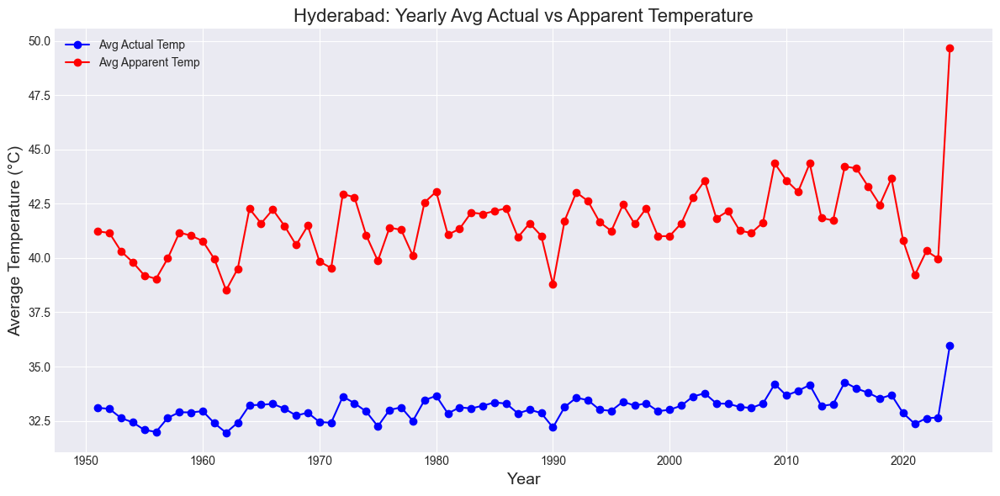

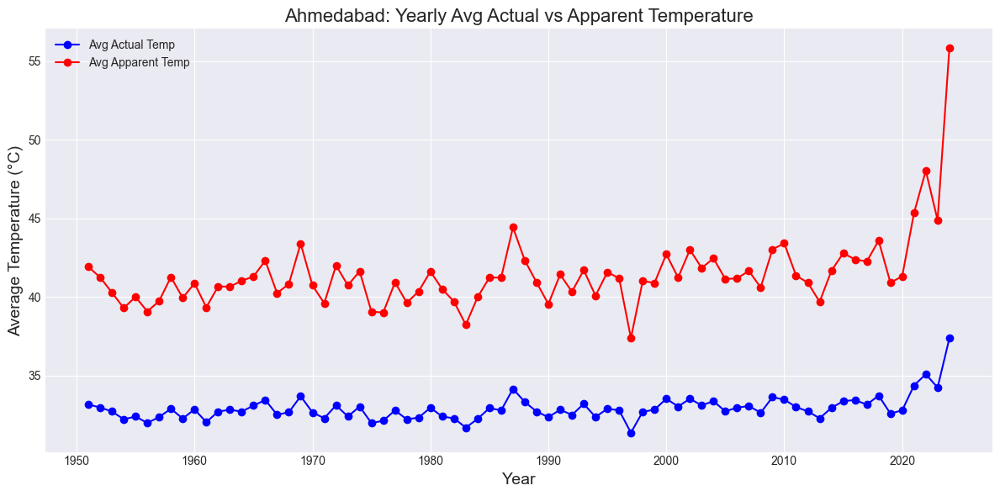

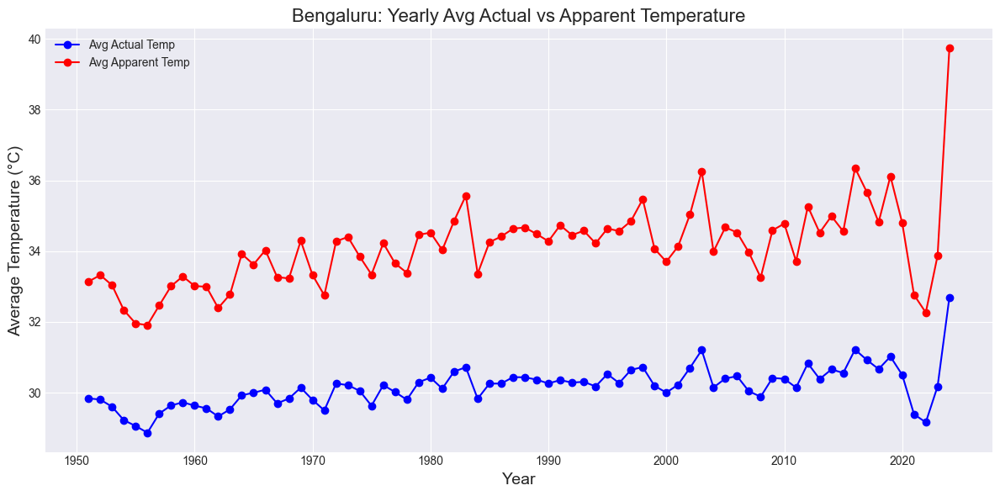

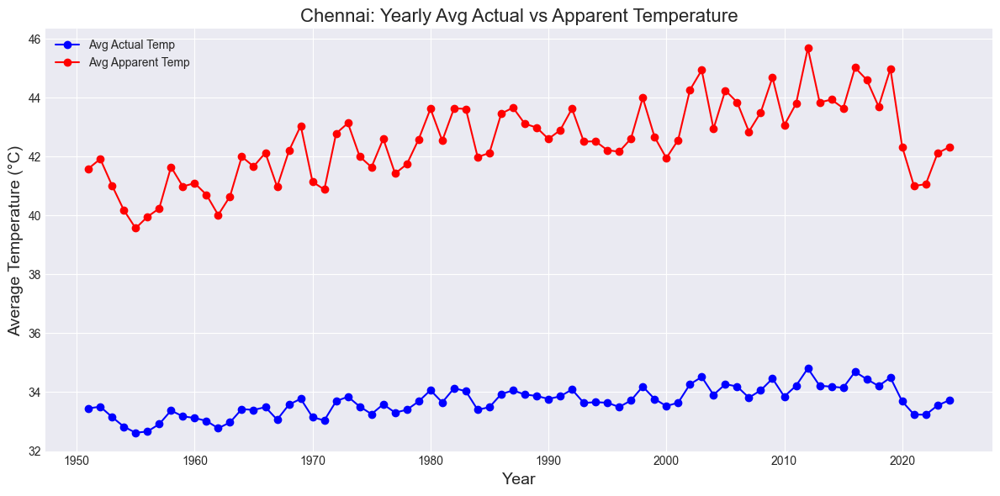

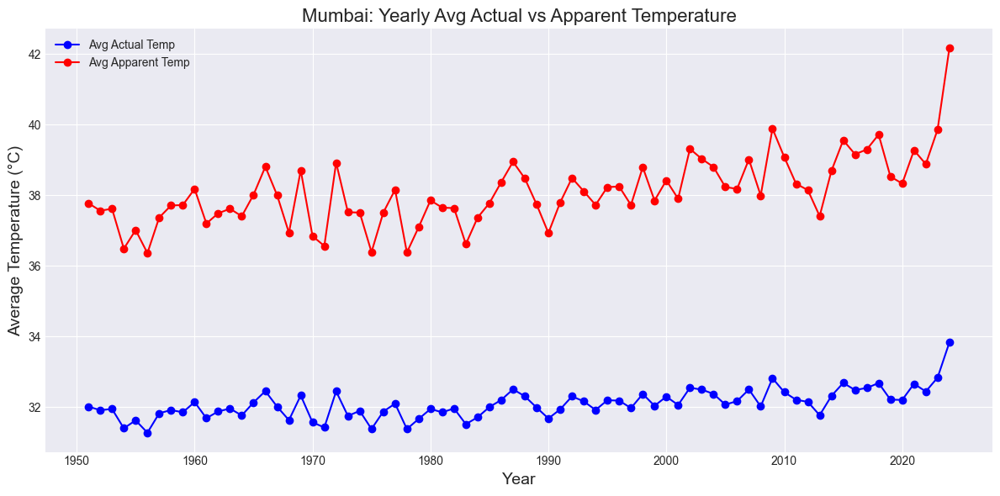

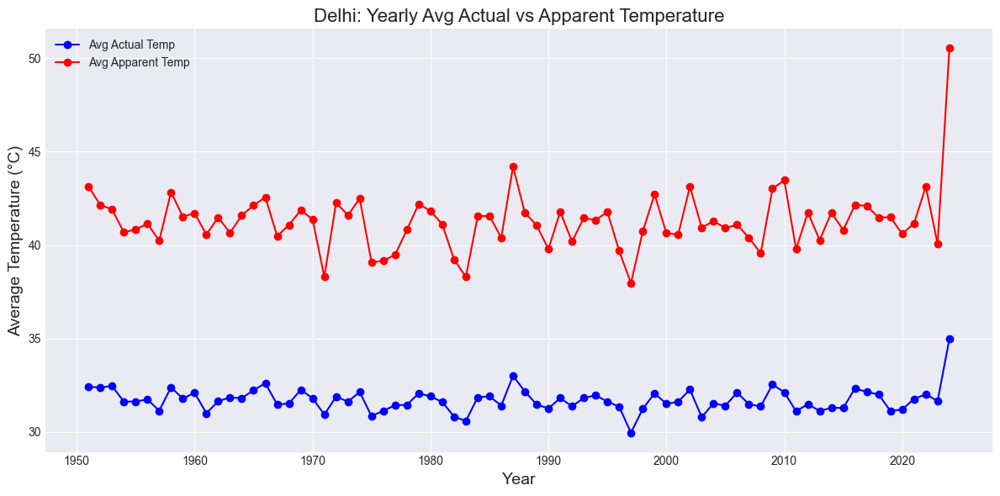

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# Create a directory for saving plots if it doesn't exist
save_dir = "heatwave_graphs"
os.makedirs(save_dir, exist_ok=True)

# Function to calculate Heat Index (Apparent Temperature)
def calculate_heat_index(T, RH):
    HI = (-8.784695 + (1.61139411 * T) + (2.338549 * RH) - 
          (0.14611605 * T * RH) - (0.012308094 * T**2) - 
          (0.016424828 * RH**2) + (0.002211732 * T**2 * RH) + 
          (0.00072546 * T * RH**2) - (0.000003582 * T**2 * RH**2))
    return HI

average_humidity = 60

for city, df in city_dataframes.items():
    # Ensure numeric data
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()

    # Calculate Apparent Temperature
    df['Apparent Temp'] = calculate_heat_index(df['Temp Max'], average_humidity)

    # Yearly average calculation
    df['Year'] = df['Date'].dt.year
    yearly_avg = df.groupby('Year').agg({'Temp Max':'mean', 'Apparent Temp':'mean'})

    # Visualization
    plt.figure(figsize=(12, 6))
    plt.plot(yearly_avg.index, yearly_avg['Temp Max'], color='blue', marker='o', label='Avg Actual Temp')
    plt.plot(yearly_avg.index, yearly_avg['Apparent Temp'], color='red', marker='o', label='Avg Apparent Temp')

    plt.title(f'{city}: Yearly Avg Actual vs Apparent Temperature', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Average Temperature (°C)', fontsize=14)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    # Save figure as image
    plt.savefig(os.path.join(save_dir, f"{city}_yearly_avg_temp.png"), dpi=300)

    plt.show()


/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/622696355.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


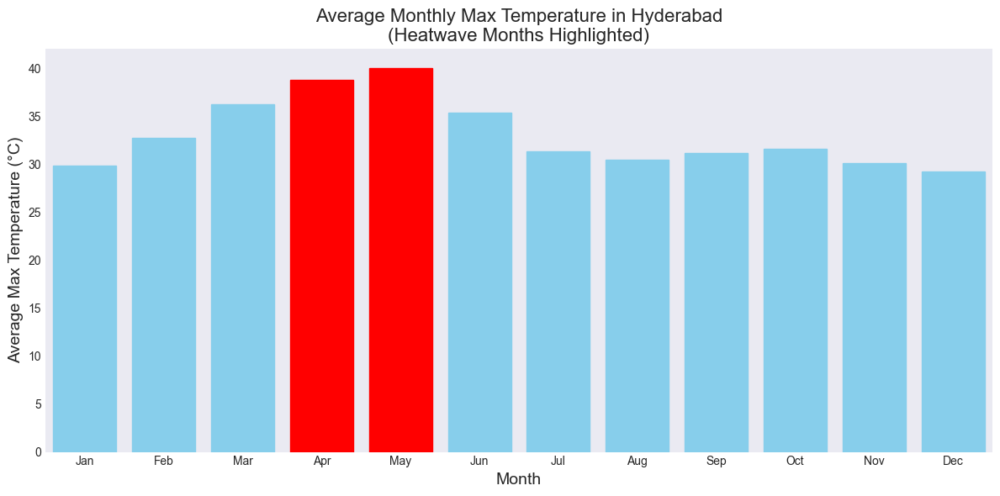

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/622696355.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


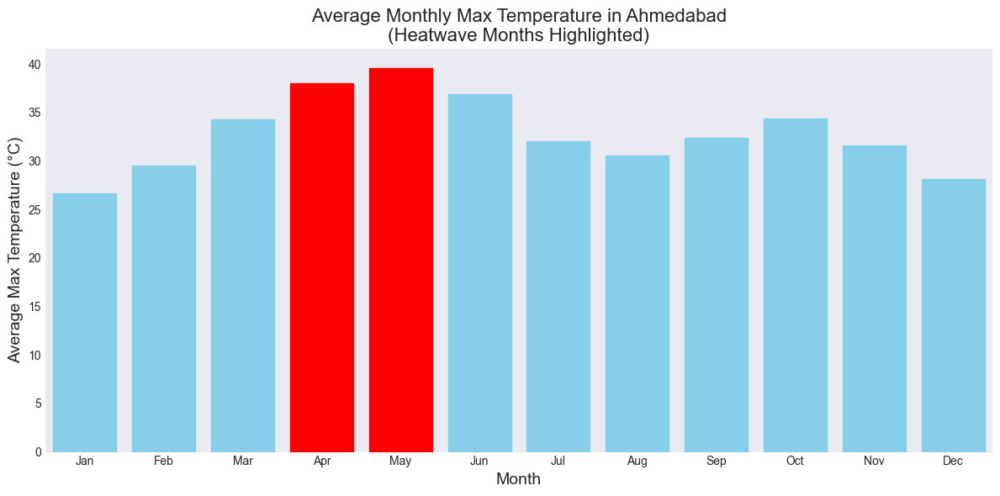

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/622696355.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


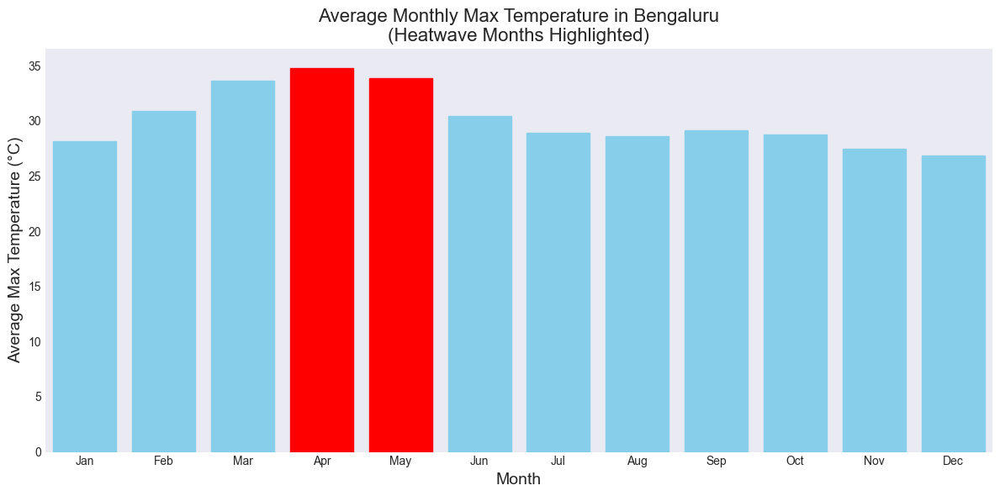

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/622696355.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


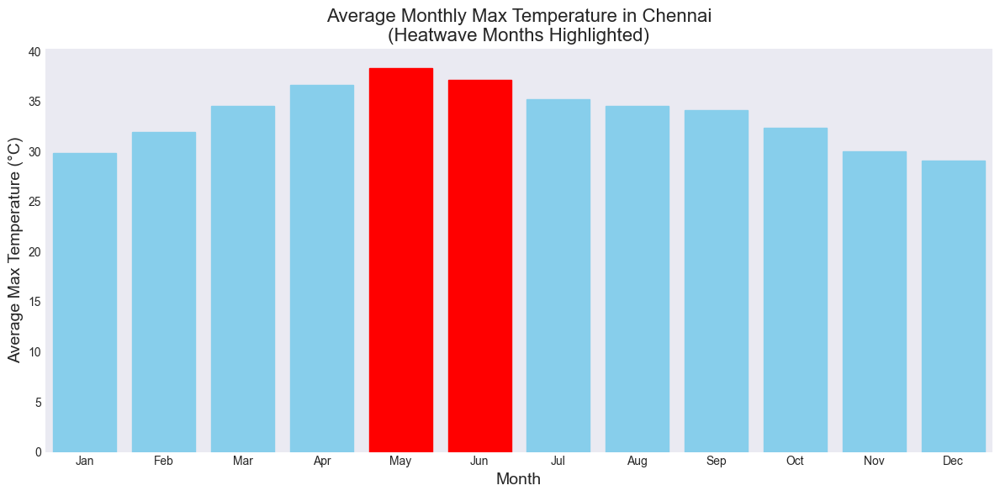

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/622696355.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


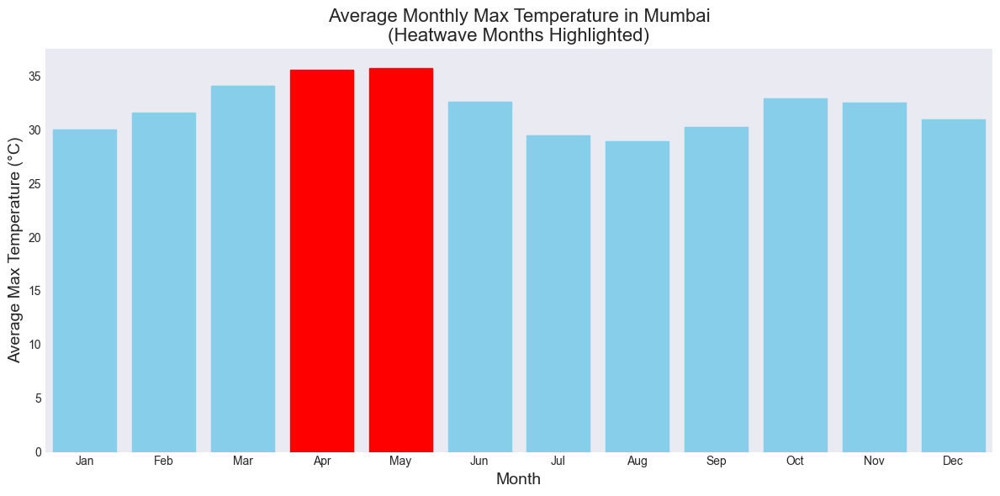

/var/folders/05/3hz0bm651t53mhds5_12rww00000gn/T/ipykernel_19694/622696355.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')


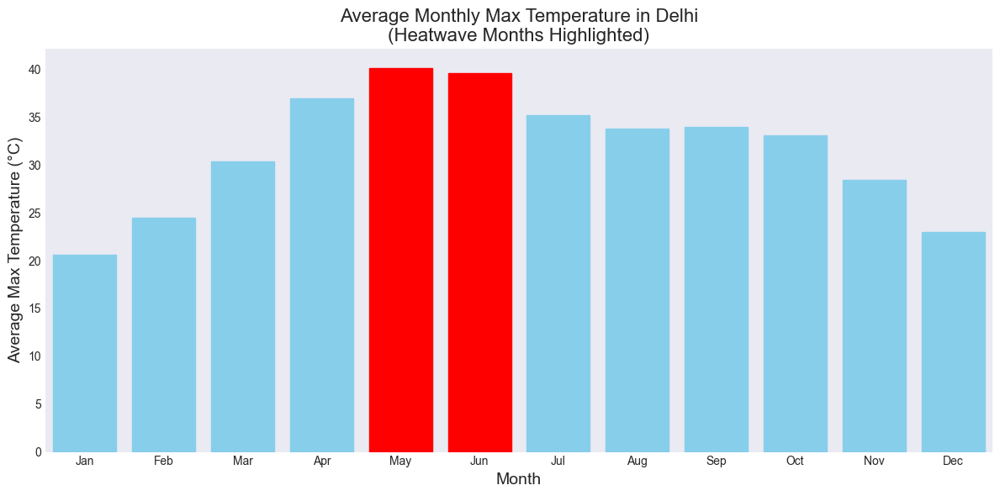

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd

plt.style.use('seaborn-v0_8-darkgrid')

# Directory to save graphs
save_dir = "monthly_heatwave_graphs"
os.makedirs(save_dir, exist_ok=True)

for city, df in city_dataframes.items():
    # Ensure Temp Max is numeric
    df['Temp Max'] = pd.to_numeric(df['Temp Max'], errors='coerce').ffill()
    
    # Extract month and compute average monthly max temperature
    df['Month'] = df['Date'].dt.month
    monthly_avg_temp = df.groupby('Month')['Temp Max'].mean()

    # Identify heatwave months (top 2 hottest months)
    heatwave_months = monthly_avg_temp.nlargest(2).index.tolist()

    plt.figure(figsize=(12, 6))
    bars = sns.barplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, palette='coolwarm')

    # Highlight heatwave months
    for bar, month in zip(bars.patches, monthly_avg_temp.index):
        bar.set_color('red' if month in heatwave_months else 'skyblue')

    plt.title(f'Average Monthly Max Temperature in {city}\n(Heatwave Months Highlighted)', fontsize=16)
    plt.xlabel('Month', fontsize=14)
    plt.ylabel('Average Max Temperature (°C)', fontsize=14)
    plt.xticks(range(0,12), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                             'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.grid(axis='y')
    plt.tight_layout()
    
    # Save each plot as PNG
    plt.savefig(os.path.join(save_dir, f"{city}_monthly_avg_temp.png"), dpi=300)

    plt.show()
